# Multimodal Fusion: Late fusion
<style>
h2: color:blue;
</style>

# Section 0: Import modules, set variables, load functions 

In [1]:
%load_ext autoreload
%autoreload 2

import os
import numpy as np
import pandas as pd
from keras import backend as K
from sklearn.metrics import confusion_matrix    
from sklearn import metrics
from keras.models import Model
from keras.layers import Dense, Reshape, concatenate, Lambda, Average, Maximum, Add, Multiply, Concatenate, BatchNormalization, Activation
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
from keras.layers.embeddings import Embedding
from keras.engine.input_layer import Input
from keras.optimizers import Adam
from utils import *
from keras.activations import relu
from sklearn.model_selection import StratifiedKFold
import random
import dill
import matplotlib.pyplot as plt
from scipy import ndimage
from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot
from PIL import Image
import io
from keras.utils.training_utils import multi_gpu_model
import tensorflow as tf

Using TensorFlow backend.


In [2]:
from keras import backend as K
print(K.tensorflow_backend._get_available_gpus())
G = len(K.tensorflow_backend._get_available_gpus())

['/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1']


In [3]:
SRC = 'PMC'

if SRC=='PMC':
    CLASSES = {0: 'bar', 1: 'gel', 2: 'map', 3: 'network', 4: 'plot',
             5: 'text', 6: 'box', 7: 'heatmap',8: 'medical', 9: 'nxmls', 10: 'screenshot',
             11: 'topology', 12: 'diagram', 13: 'histology', 14: 'microscopy',
             15: 'photo', 16: 'sequence', 17: 'tree', 18: 'fluorescence', 19: 'line',
             20: 'molecular', 21: 'pie', 22: 'table'}
    
    class_names = ['bar', 'gel', 'network', 'plot', 'histology', 'sequence',
                               'line', 'molecular']
else:
    class_names = ['cat','dog']
num_class = len(class_names)
NN_Class_Names = dict(enumerate(class_names))
test_size = 0.2
epochs = 150
#Set parameters
create_word_vec = False
w2v_epochs = 20
w2v_window_size=5
w2v_filters=''
seed = 0
max_text_len = 200
vocabulary_size = 10000
csv_fname = 'image_list.csv'
coco_loc = '/home/kevin/Documents/Lab/coco_dataset'
pmc_loc = '/gpfs/ysm/pi/krauthammer/kl533/'
filters = ''
use_glove = False
LOAD_IMG_MODEL_WEIGHTS = False
LOAD_TXT_MODEL_WEIGHTS = False
CHANNELS = 3#should be either 3 or 1 for the number of channels
shape = (100,100,CHANNELS)#image shape
embedding_output_dim = 100
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-6, verbose=1)
early_stopping = EarlyStopping(monitor='loss', min_delta=0, patience=10, verbose=0, mode='auto', baseline=None)
nltk.download('punkt')
nltk.download('stopwords')
plt.rcParams["figure.dpi"] = 600
n_splits=5

[nltk_data] Downloading package punkt to /ysm-
[nltk_data]     gpfs/home/kl533/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /ysm-
[nltk_data]     gpfs/home/kl533/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [4]:
def Generate_Model(image = True, text = True):
    #set up our text input
    if image and text:
        input_text = Input(shape=(max_text_len,), name='text_input')
        embedding = Embedding(input_length=max_text_len, input_dim=vocabulary_size, output_dim=embedding_output_dim, 
                               name='embedding_layer', trainable=True, weights=[embedding_weights])
        text_embedding = embedding(input_text)
        #set up our image branch
        image_input = Input(shape, name='image_input')
        image_branch = get_img_branch()(image_input)
        image_branch = Dense(1024, name='dense_layer1_image_branch')(image_branch)
        image_branch = BatchNormalization()(image_branch)
        image_branch = Activation('relu')(image_branch)
        image_branch = Dropout(0.5)(image_branch)        
        image_branch = Dense(512, name='dense_layer2_image_branch')(image_branch)
        image_branch = Activation('relu')(image_branch)
        image_branch = BatchNormalization()(image_branch)
        image_branch = Dropout(0.5)(image_branch) 
        image_branch_out = Dense(num_class, activation='softmax', name='image_branch_output')(image_branch)
        image_branch_model = Model(inputs=[image_input], outputs=[image_branch_out])
        #set up text branch
        text_branch = get_text_branch()(text_embedding)
        text_branch = Dense(1024, name='dense_layer1_text_branch')(text_branch)
        text_branch = BatchNormalization()(text_branch)
        text_branch = Activation('relu')(text_branch)
        text_branch = Dropout(0.5)(text_branch)        
        text_branch = Dense(512, name='dense_layer2_text_branch')(text_branch)
        text_branch = Activation('relu')(text_branch)
        text_branch = BatchNormalization()(text_branch)
        text_branch = Dropout(0.5)(text_branch)
        text_branch_out = Dense(num_class, activation='softmax', name='text_branch_output')(text_branch)
        text_branch_model = Model(inputs=[input_text], outputs=[text_branch_out])
        outputs = [model.outputs[0] for model in [text_branch_model, image_branch_model]]
        output = Average()(outputs)
        classificationModel = Model(inputs=[text_branch_model.input, image_branch_model.input], outputs=[output])
    if image and not text:
        image_input = Input(shape, name='image_input')
        x = get_img_branch()(image_input)
        x = Dense(1024, name='dense_layer1_image')(x)
        x = BatchNormalization()(x)
        x = Activation('relu')(x)
        x = Dropout(0.5)(x)        
        x = Dense(512, name='dense_layer2_image')(x)
        x = Activation('relu')(x)
        x = BatchNormalization()(x)
        x = Dropout(0.5)(x)
        output = Dense(num_class, activation='softmax', name='image_output')(x)
        classificationModel = Model(inputs=[image_input], outputs=[output])
    if not image and text:
        input_text = Input(shape=(max_text_len,), name='text_input')
        embedding = Embedding(input_length=max_text_len, input_dim=vocabulary_size, output_dim=embedding_output_dim, 
                               name='embedding_layer', trainable=True, weights=[embedding_weights])
        embedded_text = embedding(input_text)
        x = get_text_branch()(embedded_text)
        x = Dense(1024, name='dense_layer1_text')(x)
        x = BatchNormalization()(x)
        x = Activation('relu')(x)
        x = Dropout(0.5)(x)        
        x = Dense(512, name='dense_layer2_text')(x)
        x = Activation('relu')(x)
        x = BatchNormalization()(x)
        x = Dropout(0.5)(x)
        output = Dense(num_class, activation='softmax', name='text_output')(x)
        classificationModel = Model(inputs=[input_text], outputs=[output])
    if G > 1:
        classificationModel = get_multi_gpu_model(classificationModel, G)
    return classificationModel

<hr/>

# Section 1: Initalize variables and load data

In [5]:
# Load our data from source

print('Getting Data')
if SRC == 'PMC':
    image_classes = [list(CLASSES.keys())[list(CLASSES.values()).index(x)] for 
                 x in class_names]  
    data = load_PMC(csv_fname, image_classes, uniform=True)
    #dynamically add location of files
    data['location'] = pmc_loc + data['location'].astype(str)
else:
    data = load_COCO(coco_loc, class_names=class_names)

Getting Data


## Optional: Create embeddings

In [6]:
#%%Section 0.5 create embeddings - Optional
if create_word_vec:
    print('Section 0.5: create embeddings')
    from w2v_keras import w2v_keras
    w2v = w2v_keras(vocabulary_size=vocabulary_size, window_size=w2v_window_size, filters=w2v_filters, vector_dim = embedding_output_dim)
    w2v.fit(data['caption'], epochs=w2v_epochs)
    w2v.save_embeddings('w2v_embeddings.json')

## Get data into format our model understands

In [7]:
#%% Section 1: Generate our sequences from text
print('Get model data')
(X_text_train, X_text_test, X_image_train, X_image_test, y_train, y_test, 
 tokenizer) = get_model_data(data, seed=seed, test_size = test_size, vocabulary_size = vocabulary_size, 
          filters = filters, max_text_len=max_text_len, shape=shape)

Get model data
filtering sentences
filtering sents and removing stopwords
filtering sentences
filtering sents and removing stopwords
filtering sentences
filtering sents and removing stopwords


/ysm-gpfs/home/kl533/.local/lib/python3.6/site-packages/sklearn/preprocessing/_encoders.py:363: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


## Load our word embeddings

In [8]:
#%% Section 1.5: Load word embeddings
if use_glove:
    embedding_weights = load_glove('/home/kevin/Downloads', 
                        take(vocabulary_size, tokenizer.word_index.items()))
elif create_word_vec:#get weights from w2v model directly if trained.
    embedding_weights = mapTokensToEmbedding(w2v.get_embeddings(), 
                                             tokenizer.word_index, vocabulary_size)
else:
    #load embedding weights from file
    location = 'w2v_embeddings.json'
    import json
    with open(location) as f:
        embs = json.load(f)
        emb = json.loads(embs)
    embedding_weights = mapTokensToEmbedding(emb, tokenizer.word_index, 
                                             vocabulary_size)

## Lets visualize our models:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


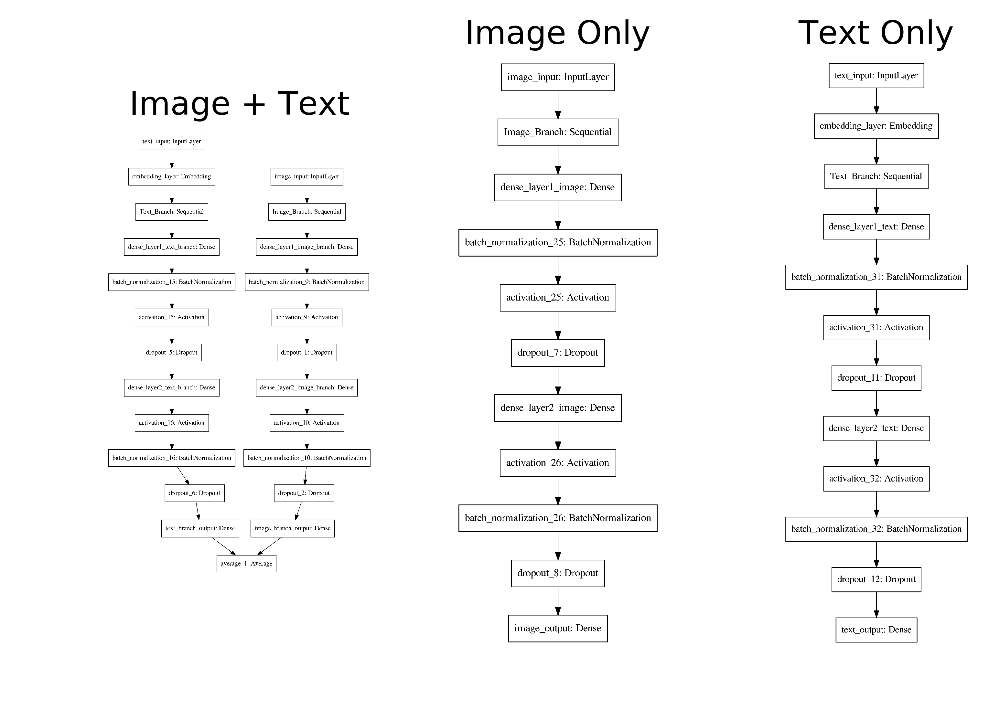

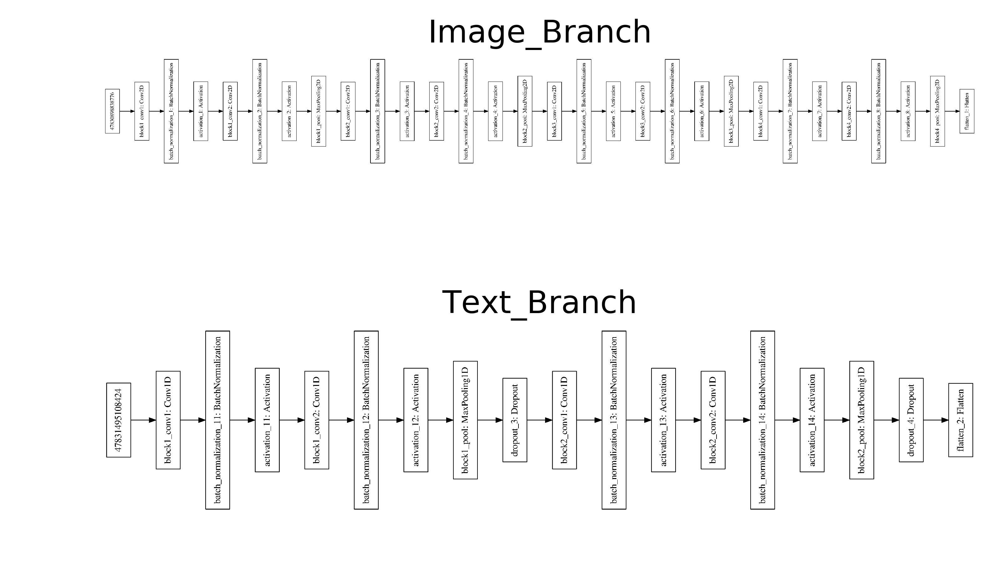

In [9]:
G_bak = G
G = 1
text_image_model_vis = Generate_Model(image = True, text=True)
image_model_vis = Generate_Model(image = True, text=False)
text_model_vis = Generate_Model(image = False, text=True)
G = G_bak
model_list = {'Image + Text': text_image_model_vis, 'Image Only': image_model_vis, 
              'Text Only': text_model_vis}
base_model_list = {'Image_Branch': text_image_model_vis.get_layer('Image_Branch'), 
                   'Text_Branch': text_image_model_vis.get_layer('Text_Branch')}
plt.rcParams["figure.dpi"] = 600
fig,ax = plt.subplots(1,len(model_list))

for i, (name,model) in enumerate(model_list.items()):
    x = model_to_dot(model)
    x.set_dpi(600)
    x = x.create(prog='dot', format='png')
    x_ = plt.imread(io.BytesIO(x))
    ax[i].imshow(x_)
    ax[i].axis("off")
    ax[i].set_title(name)

fig,ax = plt.subplots(len(base_model_list),1)
for i, (name,model) in enumerate(base_model_list.items()):
    x = model_to_dot(model)
    x.set_dpi(600)
    x = x.create(prog='dot', format='png')
    x_ = plt.imread(io.BytesIO(x))
    x_ = ndimage.rotate(x_, 90)
    ax[i].imshow(x_)
    ax[i].axis("off")
    ax[i].set_title(name)

In [10]:
print(G)

2


# Section 2: Train Test Split

## Train with only images

### Generate model and load callbacks

In [11]:
print('Train with only images')
image_model = Generate_Model(image=True, text=False)
image_model.compile(optimizer='adam',
          loss='categorical_crossentropy',
          metrics=['accuracy'])
filepath="late_fusion_weights/weights-improvement_image_only.hdf5"
if LOAD_IMG_MODEL_WEIGHTS:
    print ('Loading image model weights')
    image_model.load_weights(filepath)
checkpoint = MultiGPUCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
callbacks_list = [reduce_lr, checkpoint, early_stopping]

Train with only images
[INFO] training with 2 GPUs...


### Train model

In [12]:
history = image_model.fit([X_image_train],[y_train], 
                         epochs=epochs, batch_size=128, validation_split=0.1, callbacks=callbacks_list)

Train on 2263 samples, validate on 252 samples
Epoch 1/150
2263/2263 [==============================] - 14s 6ms/step - loss: 2.6508 - acc: 0.2382 - val_loss: 3.1554 - val_acc: 0.2976

Epoch 00001: val_acc improved from -inf to 0.29762, saving model to late_fusion_weights/weights-improvement_image_only.hdf5
Epoch 2/150
2263/2263 [==============================] - 2s 1ms/step - loss: 1.9814 - acc: 0.3663 - val_loss: 2.6285 - val_acc: 0.3492

Epoch 00002: val_acc improved from 0.29762 to 0.34921, saving model to late_fusion_weights/weights-improvement_image_only.hdf5
Epoch 3/150
2263/2263 [==============================] - 2s 1ms/step - loss: 1.6672 - acc: 0.4521 - val_loss: 2.3045 - val_acc: 0.3492

Epoch 00003: val_acc improved from 0.34921 to 0.34921, saving model to late_fusion_weights/weights-improvement_image_only.hdf5
Epoch 4/150
2263/2263 [==============================] - 2s 1ms/step - loss: 1.4644 - acc: 0.5020 - val_loss: 1.9514 - val_acc: 0.3810

Epoch 00004: val_acc improved 

### Plot training history

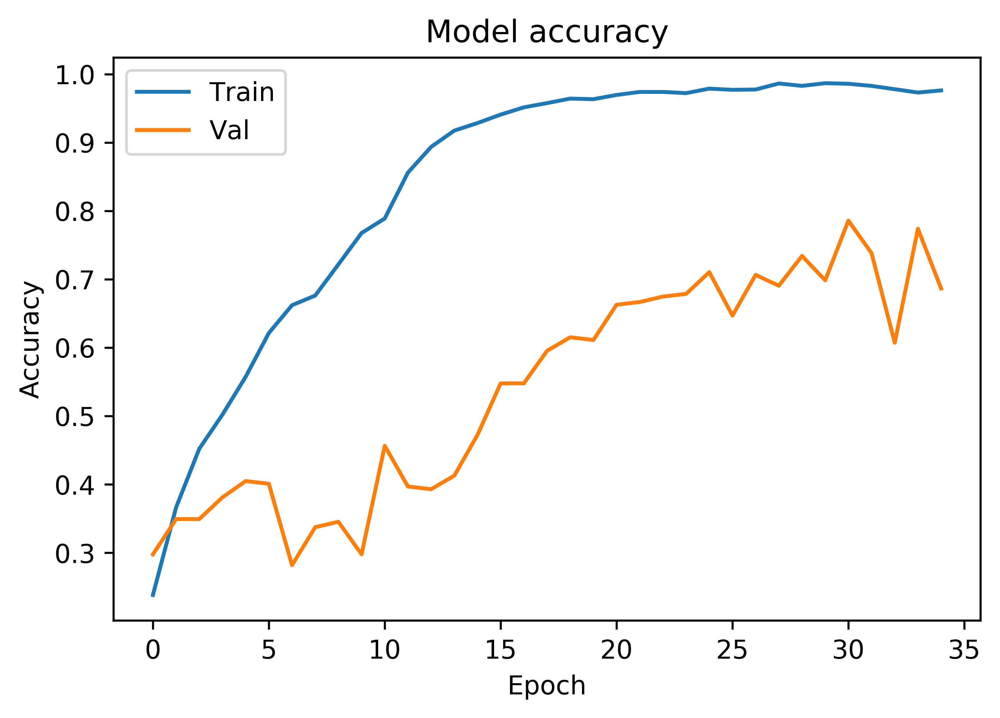

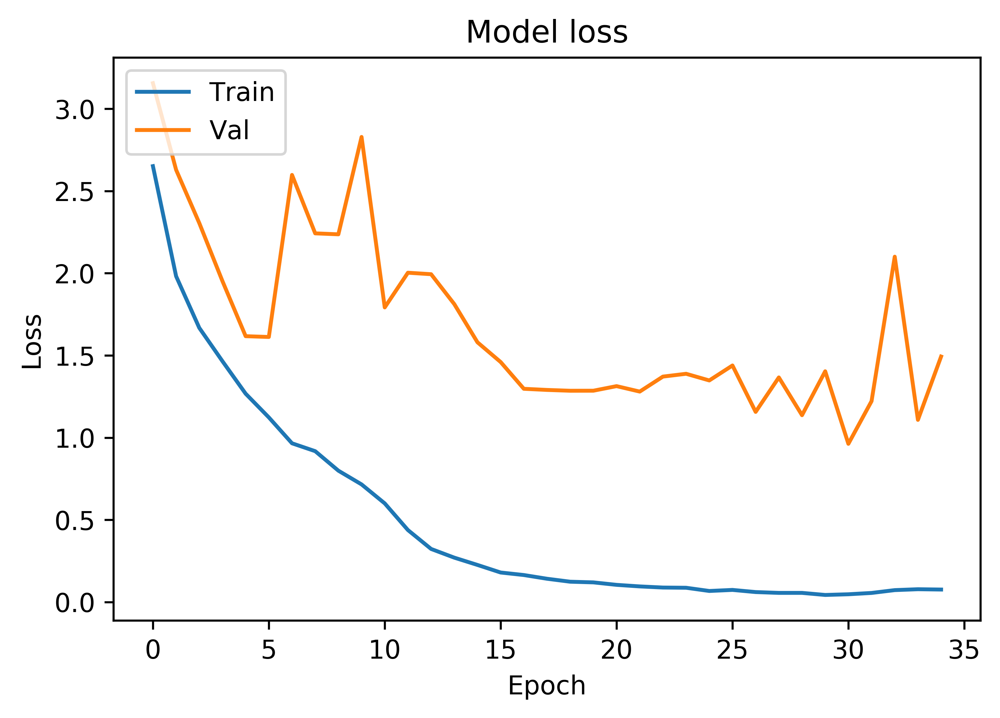

In [13]:
# Plot training & validation accuracy values
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

### Test model

In [14]:
y_hat = test_model(image_model, zip(X_image_test, y_test), image = True, text = False, class_names=class_names)

629/629 [==============================] - 1s 1ms/step
[1.4131015603606765, 0.7233704299161089]
           bar  gel  network  plot  histology  sequence  line  molecular
bar         60    3        2     0          1         0     6          0
gel          4   82        3     0          2         0     0          1
network      0    4       47     0          0         3     7          4
plot         2    2        4    25          0         0    52          1
histology    0    3        0     0         69         0     1          3
sequence     1    2       16     3          0        49     2          1
line         1    3       10     1          0         1    70          0
molecular    0    0       20     0          1         0     4         53
              precision    recall  f1-score   support

         bar       0.88      0.83      0.86        72
         gel       0.83      0.89      0.86        92
     network       0.46      0.72      0.56        65
        plot       0.86      0

## Train with only text

### Generate model and load callbacks

In [15]:
print('Train with only text')
text_model = Generate_Model(image=False, text=True)
text_model.compile(optimizer='adam',
          loss='categorical_crossentropy',
          metrics=['accuracy'])
filepath="late_fusion_weights/weights-improvement_text_only.hdf5"
if LOAD_TXT_MODEL_WEIGHTS:
    print ('Loading text model weights')
    text_model.load_weights(filepath)
checkpoint = MultiGPUCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
callbacks_list = [reduce_lr, checkpoint, early_stopping]

Train with only text
[INFO] training with 2 GPUs...


### Train model

In [16]:
history = text_model.fit([X_text_train],[y_train], 
                         epochs=epochs, batch_size=128, validation_split=0.1, callbacks=callbacks_list)

Train on 2263 samples, validate on 252 samples
Epoch 1/150
2263/2263 [==============================] - 5s 2ms/step - loss: 2.8050 - acc: 0.2201 - val_loss: 1.9535 - val_acc: 0.3452

Epoch 00001: val_acc improved from -inf to 0.34524, saving model to late_fusion_weights/weights-improvement_text_only.hdf5
Epoch 2/150
2263/2263 [==============================] - 0s 161us/step - loss: 2.1686 - acc: 0.3248 - val_loss: 1.8901 - val_acc: 0.4206

Epoch 00002: val_acc improved from 0.34524 to 0.42063, saving model to late_fusion_weights/weights-improvement_text_only.hdf5
Epoch 3/150
2263/2263 [==============================] - 0s 156us/step - loss: 1.7510 - acc: 0.4278 - val_loss: 1.4067 - val_acc: 0.5317

Epoch 00003: val_acc improved from 0.42063 to 0.53175, saving model to late_fusion_weights/weights-improvement_text_only.hdf5
Epoch 4/150
2263/2263 [==============================] - 0s 158us/step - loss: 1.4353 - acc: 0.5099 - val_loss: 1.2473 - val_acc: 0.6071

Epoch 00004: val_acc improve

### Plot training history

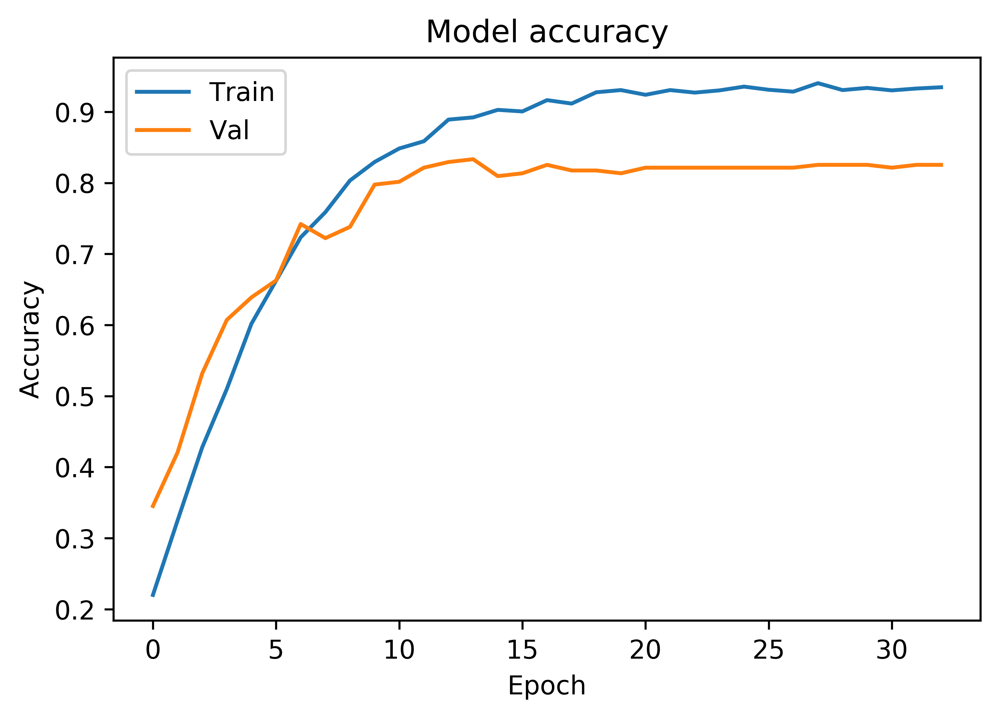

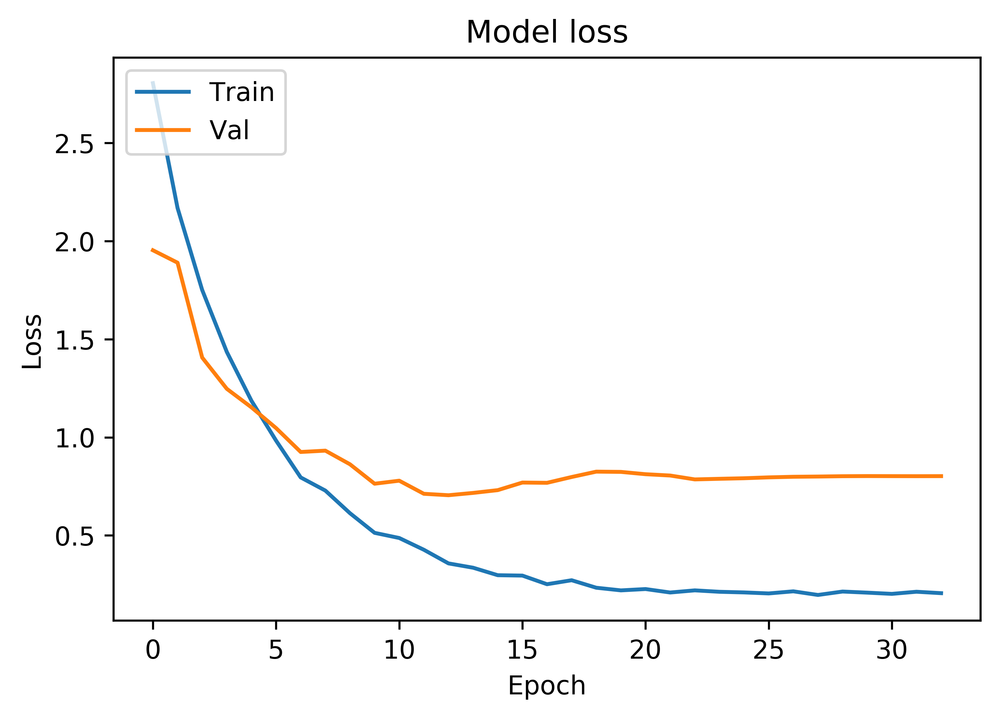

In [17]:
# Plot training & validation accuracy values
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

### Test model

In [18]:
y_hat = test_model(text_model, zip(X_text_test, y_test), image = False, text = True, class_names=class_names)

629/629 [==============================] - 0s 385us/step
[0.7735170787392814, 0.7996820355447184]
           bar  gel  network  plot  histology  sequence  line  molecular
bar         46    6        2     3          8         0     3          4
gel          5   66        0     0         12         3     5          1
network      1    2       52     2          3         1     1          3
plot         8    2        1    66          2         1     3          3
histology    0    0        1     1         72         0     1          1
sequence     1    3        0     0          0        69     0          1
line         5    0        4     9          2         1    65          0
molecular    0    0        2     0          7         1     1         67
              precision    recall  f1-score   support

         bar       0.70      0.64      0.67        72
         gel       0.84      0.72      0.77        92
     network       0.84      0.80      0.82        65
        plot       0.81     

## Model fusion: Test with images and text

In [42]:
#Take the image model and text model and merge it
outputs = [model.outputs[0] for model in [text_model.layers[-2], image_model.layers[-2]]]
output = Average()(outputs)    
text_image_model = Model(inputs=[text_model.input, image_model.input], outputs=[output])
#text_image_model = get_multi_gpu_model(text_image_model, G)
text_image_model.compile(optimizer='adam',
          loss='categorical_crossentropy',
          metrics=['accuracy'])
filepath="late_fusion_weights/weights-improvement_image_text_only.hdf5"
checkpoint = MultiGPUCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
callbacks_list = [reduce_lr, checkpoint, early_stopping]
y_hat = test_model(text_image_model, zip(X_text_test, X_image_test, y_test), image = True, text = True)

629/629 [==============================] - 5s 8ms/step
[0.8291253855004789, 0.8124006362143306]
    0   1   2   3   4   5   6   7
0  65   0   0   1   2   0   3   1
1  10  71   1   0   8   0   2   0
2  11   0  49   1   2   0   0   2
3  15   0   2  61   1   1   6   0
4   0   1   2   0  70   0   0   3
5   9   0   0   0   1  63   1   0
6  15   0   2   5   0   0  64   0
7   7   0   0   0   2   0   1  68
              precision    recall  f1-score   support

           0       0.49      0.90      0.64        72
           1       0.99      0.77      0.87        92
           2       0.88      0.75      0.81        65
           3       0.90      0.71      0.79        86
           4       0.81      0.92      0.86        76
           5       0.98      0.85      0.91        74
           6       0.83      0.74      0.79        86
           7       0.92      0.87      0.89        78

   micro avg       0.81      0.81      0.81       629
   macro avg       0.85      0.82      0.82       629
we

### Model fusion: Train with images and text using pretrained branches

In [44]:
history = text_image_model.fit([X_text_train, X_image_train],[y_train], 
                         epochs=epochs, batch_size=128, validation_split=0.1, callbacks=callbacks_list)

Train on 2263 samples, validate on 252 samples
Epoch 1/150
2263/2263 [==============================] - 16s 7ms/step - loss: 0.1498 - acc: 0.9624 - val_loss: 1.2328 - val_acc: 0.7063

Epoch 00001: val_acc improved from -inf to 0.70635, saving model to late_fusion_weights/weights-improvement_image_text_only.hdf5
Epoch 2/150
2263/2263 [==============================] - 4s 2ms/step - loss: 0.1373 - acc: 0.9677 - val_loss: 0.5096 - val_acc: 0.8929

Epoch 00002: val_acc improved from 0.70635 to 0.89286, saving model to late_fusion_weights/weights-improvement_image_text_only.hdf5
Epoch 3/150
2263/2263 [==============================] - 4s 2ms/step - loss: 0.1213 - acc: 0.9708 - val_loss: 0.6912 - val_acc: 0.8532

Epoch 00003: val_acc did not improve from 0.89286
Epoch 4/150
2263/2263 [==============================] - 4s 2ms/step - loss: 0.1028 - acc: 0.9814 - val_loss: 0.6807 - val_acc: 0.8889

Epoch 00004: val_acc did not improve from 0.89286
Epoch 5/150
2263/2263 [========================

2263/2263 [==============================] - 4s 2ms/step - loss: 0.0435 - acc: 0.9916 - val_loss: 0.4108 - val_acc: 0.9325

Epoch 00038: val_acc did not improve from 0.93651


### Plot training history

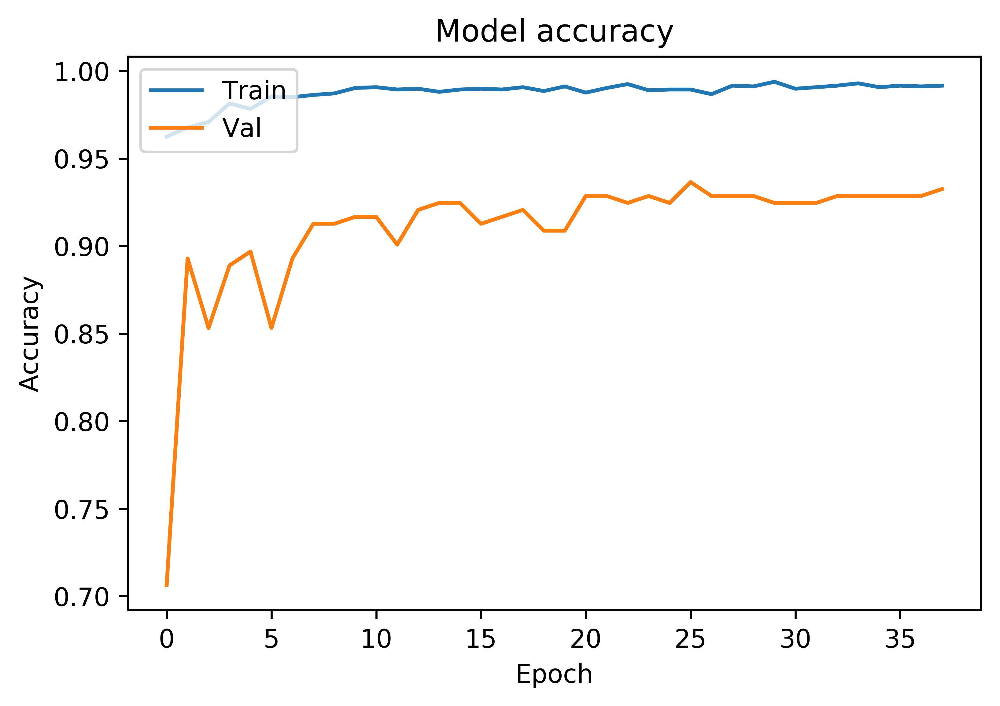

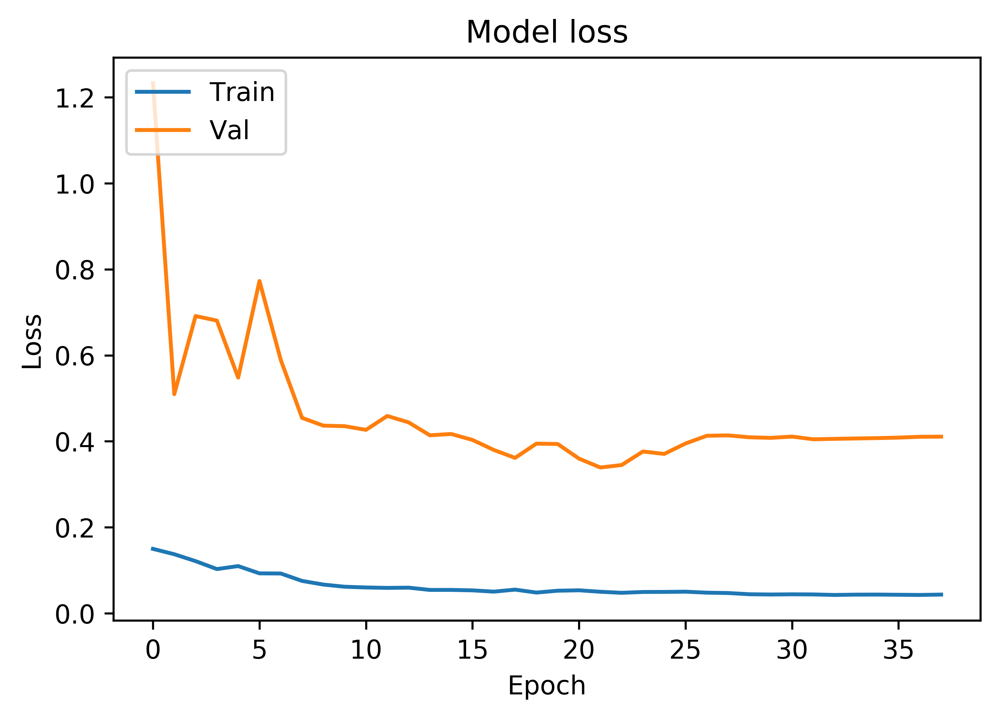

In [45]:
# Plot training & validation accuracy values
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

### Test model after we trained on pretrained branches

In [46]:
y_hat = test_model(text_image_model, zip(X_text_test, X_image_test, y_test), image = True, text = True, class_names=class_names)

629/629 [==============================] - 1s 888us/step
[0.504775527266516, 0.9030206680108329]
           bar  gel  network  plot  histology  sequence  line  molecular
bar         60    3        0     1          2         0     5          1
gel          3   85        1     0          1         0     2          0
network      0    0       62     0          1         0     0          2
plot         4    2        0    73          1         1     4          1
histology    0    0        1     0         75         0     0          0
sequence     0    1        2     1          0        70     0          0
line         3    0        2     9          0         1    71          0
molecular    0    0        2     0          3         1     0         72
              precision    recall  f1-score   support

         bar       0.86      0.83      0.85        72
         gel       0.93      0.92      0.93        92
     network       0.89      0.95      0.92        65
        plot       0.87      

### Train Image + Text model from scratch

In [47]:
text_image_model = Generate_Model(image = True, text=True)
#set optimizer:
optimizer = Adam(lr=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07, decay=0.0005, amsgrad=True) #RMSprop(lr=0.001, rho=0.9, epsilon=1e-07, decay=0.0)
text_image_model.compile(optimizer='adam',
          loss='categorical_crossentropy',
          metrics=['accuracy'])
# checkpoint
filepath="late_fusion_weights/weights-improvement_image_text.hdf5"
checkpoint = MultiGPUCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
callbacks_list = [reduce_lr, checkpoint, early_stopping]

[INFO] training with 2 GPUs...


### Train model

In [48]:
history = text_image_model.fit([X_text_train, X_image_train],[y_train], 
                         epochs=epochs, batch_size=128, validation_split=0.1, callbacks=callbacks_list)

Train on 2263 samples, validate on 252 samples
Epoch 1/150
2263/2263 [==============================] - 16s 7ms/step - loss: 2.1901 - acc: 0.2536 - val_loss: 1.9164 - val_acc: 0.2659

Epoch 00001: val_acc improved from -inf to 0.26587, saving model to late_fusion_weights/weights-improvement_image_text.hdf5
Epoch 2/150
2263/2263 [==============================] - 3s 1ms/step - loss: 1.6285 - acc: 0.4392 - val_loss: 1.4262 - val_acc: 0.4921

Epoch 00002: val_acc improved from 0.26587 to 0.49206, saving model to late_fusion_weights/weights-improvement_image_text.hdf5
Epoch 3/150
2263/2263 [==============================] - 3s 1ms/step - loss: 1.3476 - acc: 0.5515 - val_loss: 1.3460 - val_acc: 0.4960

Epoch 00003: val_acc improved from 0.49206 to 0.49603, saving model to late_fusion_weights/weights-improvement_image_text.hdf5
Epoch 4/150
2263/2263 [==============================] - 3s 1ms/step - loss: 1.0953 - acc: 0.6469 - val_loss: 1.2491 - val_acc: 0.5714

Epoch 00004: val_acc improved 

2263/2263 [==============================] - 3s 1ms/step - loss: 0.0830 - acc: 0.9845 - val_loss: 0.4529 - val_acc: 0.9206

Epoch 00037: val_acc did not improve from 0.92063
Epoch 38/150
2263/2263 [==============================] - 3s 1ms/step - loss: 0.0836 - acc: 0.9872 - val_loss: 0.4594 - val_acc: 0.9048

Epoch 00038: val_acc did not improve from 0.92063
Epoch 39/150
2263/2263 [==============================] - 3s 1ms/step - loss: 0.0885 - acc: 0.9859 - val_loss: 0.4413 - val_acc: 0.8929

Epoch 00039: val_acc did not improve from 0.92063
Epoch 40/150
2263/2263 [==============================] - 3s 1ms/step - loss: 0.0837 - acc: 0.9823 - val_loss: 0.4861 - val_acc: 0.9008

Epoch 00040: ReduceLROnPlateau reducing learning rate to 4.0000001899898055e-05.

Epoch 00040: val_acc did not improve from 0.92063
Epoch 41/150
2263/2263 [==============================] - 3s 1ms/step - loss: 0.0823 - acc: 0.9854 - val_loss: 0.4700 - val_acc: 0.9087

Epoch 00041: val_acc did not improve from 0.92

### Plot training history

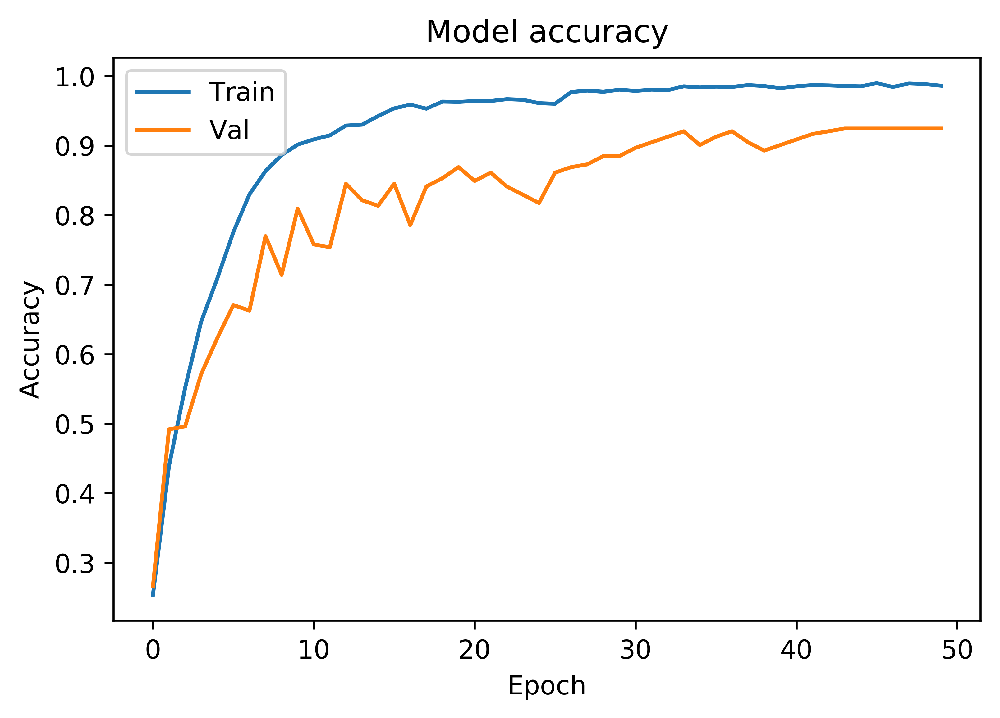

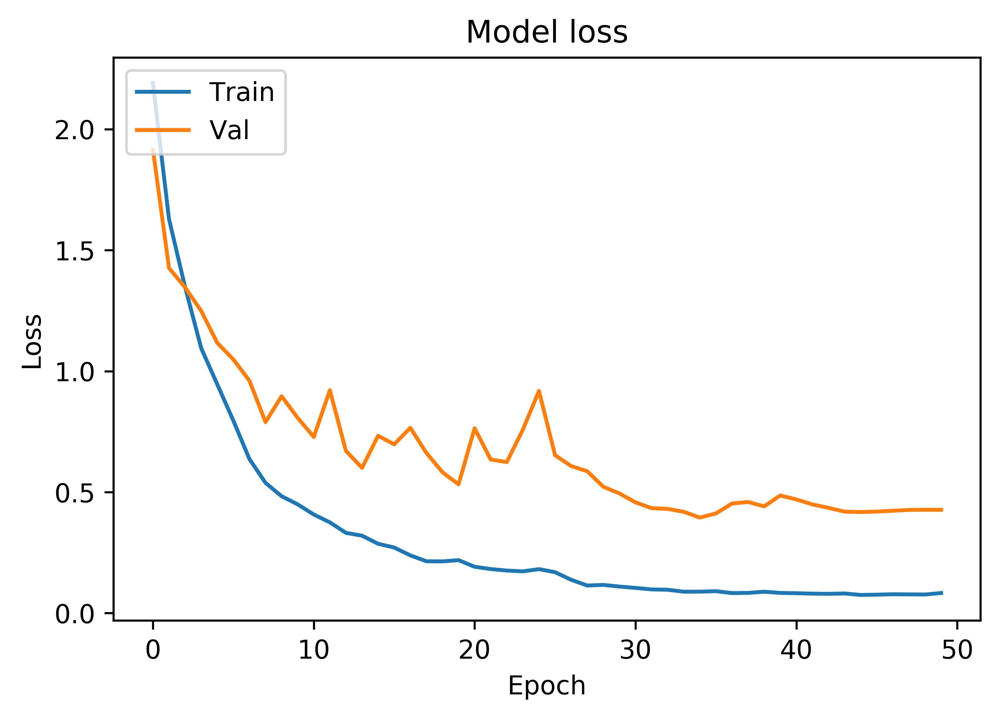

In [49]:
# Plot training & validation accuracy values
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

### Test model

In [50]:
y_hat = test_model(text_image_model, zip(X_text_test, X_image_test, y_test), image = True, text = True, class_names=class_names)

629/629 [==============================] - 1s 905us/step
[0.5887964055155344, 0.8871224168184642]
           bar  gel  network  plot  histology  sequence  line  molecular
bar         62    2        1     1          2         1     3          0
gel          3   83        1     0          1         1     3          0
network      0    0       56     0          4         1     3          1
plot         5    2        4    69          1         0     5          0
histology    0    0        0     0         76         0     0          0
sequence     0    1        1     0          0        71     0          1
line         1    0        4     8          0         2    66          5
molecular    0    0        1     1          1         0     0         75
              precision    recall  f1-score   support

         bar       0.87      0.86      0.87        72
         gel       0.94      0.90      0.92        92
     network       0.82      0.86      0.84        65
        plot       0.87     

### Inspect misclassifications

blue = ground truth, red = prediction


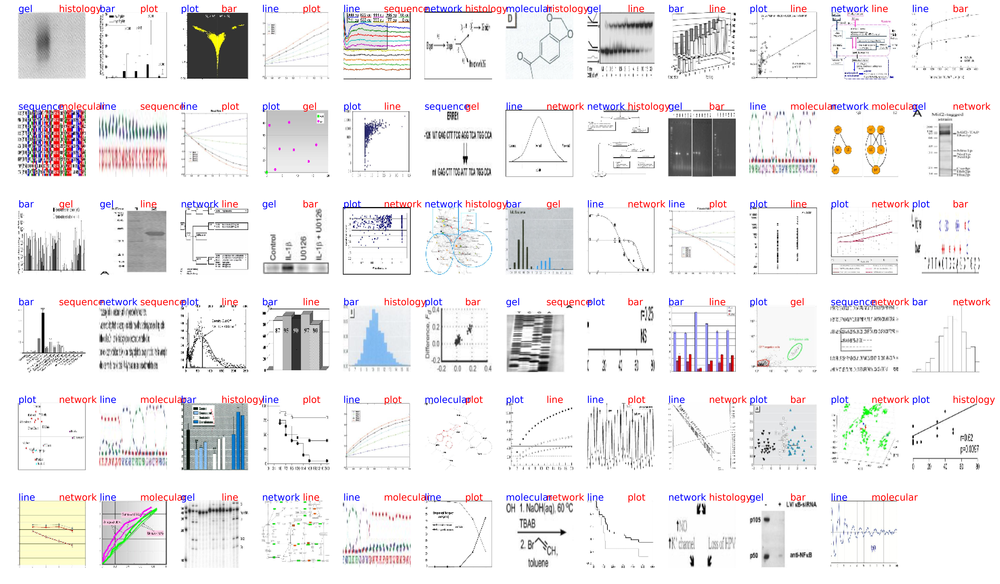

In [51]:
y_hat = text_image_model.predict([X_text_test, X_image_test])
#convert to categorical from one-hot
y_hat_fig = [ np.argmax(t) for t in y_hat ]
y_test_fig = [ np.argmax(t) for t in y_test ]
test_wrong = [im for im in zip(X_image_test, y_hat_fig,y_test_fig) if im[1] != im[2]]#Need this for images
import matplotlib.pyplot as plt
print('blue = ground truth, red = prediction')
plt.figure(figsize=(20, 20), dpi=300)
for ind, val in enumerate(test_wrong[:100]):
    plt.subplots_adjust(left=0, right=1, bottom=0, top=1)
    plt.subplot(10, 12, ind + 1)
    im = val[0]
    plt.axis("off")
    plt.text(0, 0, NN_Class_Names[val[2]], fontsize=14, color='blue')
    plt.text(60, 0, NN_Class_Names[val[1]], fontsize=14, color='red')
    plt.imshow(im, cmap='gray')

### Load and test using best val_acc weights

In [52]:
text_image_model.layers[-2].load_weights(filepath)#as per the multigpu checkpoint
#text_image_model.load_weights(filepath)
print('Test on Image + text')
y_hat = test_model(text_image_model, zip(X_text_test, X_image_test, y_test))

Test on Image + text
629/629 [==============================] - 1s 861us/step
[0.5894624339757171, 0.8759936410785669]
    0   1   2   3   4   5   6   7
0  59   1   3   1   4   1   3   0
1   3  83   1   0   1   1   3   0
2   0   0  55   0   4   1   4   1
3   7   2   2  67   1   0   7   0
4   0   0   0   0  76   0   0   0
5   0   1   1   0   0  71   0   1
6   1   0   3   9   0   2  66   5
7   0   0   1   1   2   0   0  74
              precision    recall  f1-score   support

           0       0.84      0.82      0.83        72
           1       0.95      0.90      0.93        92
           2       0.83      0.85      0.84        65
           3       0.86      0.78      0.82        86
           4       0.86      1.00      0.93        76
           5       0.93      0.96      0.95        74
           6       0.80      0.77      0.78        86
           7       0.91      0.95      0.93        78

   micro avg       0.88      0.88      0.88       629
   macro avg       0.87      0.88

### Inspect misclassifications

blue = ground truth, red = prediction


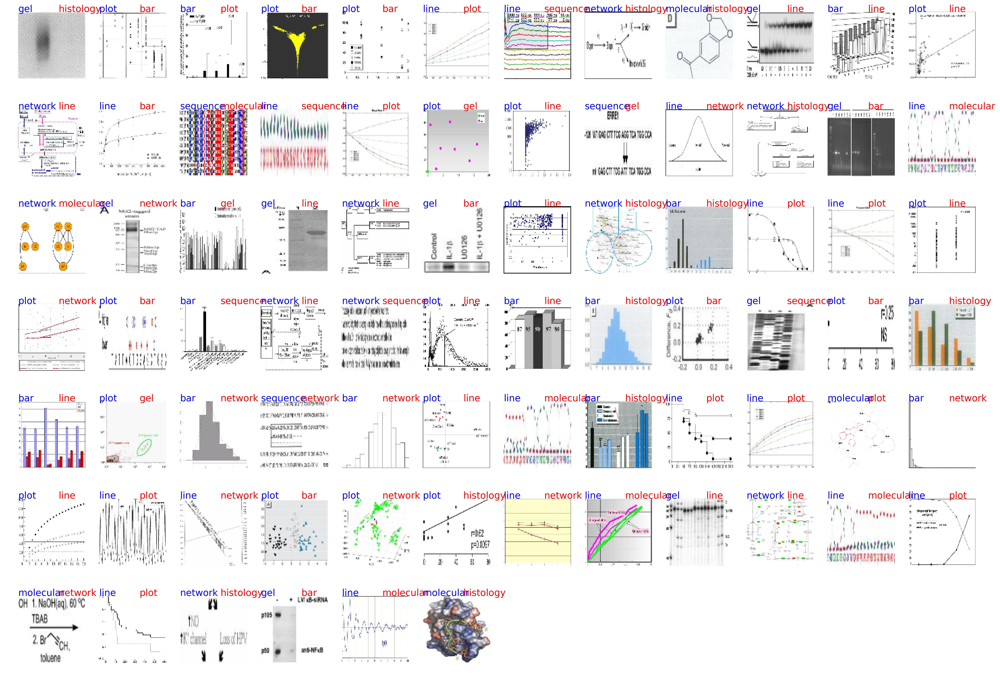

In [53]:
y_hat = text_image_model.predict([X_text_test, X_image_test])
#convert to categorical from one-hot
y_hat_fig = [ np.argmax(t) for t in y_hat ]
y_test_fig = [ np.argmax(t) for t in y_test ]
test_wrong = [im for im in zip(X_image_test, y_hat_fig,y_test_fig) if im[1] != im[2]]#Need this for images
import matplotlib.pyplot as plt
print('blue = ground truth, red = prediction')
plt.figure(figsize=(20, 20), dpi=300)
for ind, val in enumerate(test_wrong[:100]):
    plt.subplots_adjust(left=0, right=1, bottom=0, top=1)
    plt.subplot(10, 12, ind + 1)
    im = val[0]
    plt.axis("off")
    plt.text(0, 0, NN_Class_Names[val[2]], fontsize=14, color='blue')
    plt.text(60, 0, NN_Class_Names[val[1]], fontsize=14, color='red')
    plt.imshow(im, cmap='gray')

# Section 3: K-Fold Validation

### Get data into format our model understands

In [54]:
#Get all data to kfoldsplit
X_text, X_image, y, tokenizer = get_model_data(data, seed=seed, test_size = test_size, 
                vocabulary_size = vocabulary_size, filters = filters, 
                max_text_len=max_text_len, shape=shape, split=True)
X_text = np.array(X_text)#need to fix this!!!!!!!!!!!!!!!!!!!!!!!!!!!

filtering sentences
filtering sents and removing stopwords
filtering sentences
filtering sents and removing stopwords


/ysm-gpfs/home/kl533/.local/lib/python3.6/site-packages/sklearn/preprocessing/_encoders.py:363: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


### Load our word embeddings

In [55]:
#%% Section 1.5: Load word embeddings
if use_glove:
    embedding_weights = load_glove('/home/kevin/Downloads', 
                        take(vocabulary_size, tokenizer.word_index.items()))
elif create_word_vec:#get weights from w2v model directly if trained.
    embedding_weights = mapTokensToEmbedding(w2v.get_embeddings(), 
                                             tokenizer.word_index, vocabulary_size)
else:
    #load embedding weights from file
    location = 'w2v_embeddings.json'
    import json
    with open(location) as f:
        embs = json.load(f)
        emb = json.loads(embs)
    embedding_weights = mapTokensToEmbedding(emb, tokenizer.word_index, 
                                             vocabulary_size)

### K fold validation on images only

In [56]:
#set K folds to 5
kfold = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=seed)
cvscores = []
count = 1
confusion_matrix_list = []
report_list = []

for train, test in kfold.split(np.zeros(len(y)), y.argmax(1)):
    print('K-fold: {}'.format(count))
    random.shuffle(train)
    image_model = Generate_Model(image = True, text=False)
    image_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    filepath="late_fusion_weights/best_weight_image_only_k-fold_{}.hdf5".format(count)
    checkpoint = MultiGPUCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
    callbacks_list = [reduce_lr, checkpoint, early_stopping]

    history = image_model.fit([X_image[train]], y[train], 
                     epochs=epochs, batch_size=128, validation_split=0.1, callbacks=callbacks_list)
    filepath="late_fusion_weights/final_weight_image_only_k-fold_{}.hdf5".format(count)
    image_model.save_weights(filepath)
    scores = image_model.evaluate([X_image[test]], y[test], verbose=0)
    print('Results from K-fold: {}'.format(count))
    print("%s: %.2f%%" % (image_model.metrics_names[1], scores[1]*100))
    cvscores.append(scores[1] * 100)
    y_hat = test_model(image_model, zip(X_image[test], y[test]), image = True, text = False, 
                       class_names=class_names)
    cm = confusion_matrix([np.argmax(t) for t in y[test]], y_hat)
    confusion_matrix_list.append(pd.DataFrame(cm, index=class_names, columns=class_names))
    report_list.append(classification_report([np.argmax(t) for t in y[test]], y_hat, target_names=class_names))
    count += 1
    print('================================================')
print('Average for kfold accuracy and stdev')
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

K-fold: 1
[INFO] training with 2 GPUs...
Train on 2260 samples, validate on 252 samples
Epoch 1/150
2260/2260 [==============================] - 13s 6ms/step - loss: 2.6546 - acc: 0.2186 - val_loss: 4.8313 - val_acc: 0.2778

Epoch 00001: val_acc improved from -inf to 0.27778, saving model to late_fusion_weights/best_weight_image_only_k-fold_1.hdf5
Epoch 2/150
2260/2260 [==============================] - 2s 1ms/step - loss: 2.1114 - acc: 0.3279 - val_loss: 2.6195 - val_acc: 0.3889

Epoch 00002: val_acc improved from 0.27778 to 0.38889, saving model to late_fusion_weights/best_weight_image_only_k-fold_1.hdf5
Epoch 3/150
2260/2260 [==============================] - 3s 1ms/step - loss: 1.8153 - acc: 0.4062 - val_loss: 1.9094 - val_acc: 0.4325

Epoch 00003: val_acc improved from 0.38889 to 0.43254, saving model to late_fusion_weights/best_weight_image_only_k-fold_1.hdf5
Epoch 4/150
2260/2260 [==============================] - 3s 1ms/step - loss: 1.5450 - acc: 0.4712 - val_loss: 1.7822 - val

2260/2260 [==============================] - 3s 1ms/step - loss: 0.0228 - acc: 0.9947 - val_loss: 1.0495 - val_acc: 0.7500

Epoch 00037: val_acc did not improve from 0.75397
Epoch 38/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.0170 - acc: 0.9951 - val_loss: 1.0472 - val_acc: 0.7659

Epoch 00038: val_acc improved from 0.75397 to 0.76587, saving model to late_fusion_weights/best_weight_image_only_k-fold_1.hdf5
Epoch 39/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.0228 - acc: 0.9920 - val_loss: 1.0824 - val_acc: 0.7460

Epoch 00039: val_acc did not improve from 0.76587
Epoch 40/150
2260/2260 [==============================] - 2s 1ms/step - loss: 0.0209 - acc: 0.9942 - val_loss: 1.0796 - val_acc: 0.7619

Epoch 00040: val_acc did not improve from 0.76587
Epoch 41/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.0206 - acc: 0.9947 - val_loss: 1.0552 - val_acc: 0.7500

Epoch 00041: val_acc did not improve from 0.76587


2260/2260 [==============================] - 3s 1ms/step - loss: 0.0574 - acc: 0.9810 - val_loss: 1.1298 - val_acc: 0.7024

Epoch 00023: val_acc did not improve from 0.71429
Epoch 24/150
2260/2260 [==============================] - 2s 1ms/step - loss: 0.0459 - acc: 0.9872 - val_loss: 1.0943 - val_acc: 0.6865

Epoch 00024: val_acc did not improve from 0.71429
Epoch 25/150
2260/2260 [==============================] - 2s 1ms/step - loss: 0.0543 - acc: 0.9841 - val_loss: 1.0305 - val_acc: 0.7183

Epoch 00025: val_acc improved from 0.71429 to 0.71825, saving model to late_fusion_weights/best_weight_image_only_k-fold_2.hdf5
Epoch 26/150
2260/2260 [==============================] - 2s 1ms/step - loss: 0.0435 - acc: 0.9858 - val_loss: 0.9205 - val_acc: 0.7222

Epoch 00026: val_acc improved from 0.71825 to 0.72222, saving model to late_fusion_weights/best_weight_image_only_k-fold_2.hdf5
Epoch 27/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.0378 - acc: 0.9867 - val_loss

[INFO] training with 2 GPUs...
Train on 2260 samples, validate on 252 samples
Epoch 1/150
2260/2260 [==============================] - 14s 6ms/step - loss: 2.7556 - acc: 0.2226 - val_loss: 3.7290 - val_acc: 0.3095

Epoch 00001: val_acc improved from -inf to 0.30952, saving model to late_fusion_weights/best_weight_image_only_k-fold_3.hdf5
Epoch 2/150
2260/2260 [==============================] - 3s 1ms/step - loss: 2.0794 - acc: 0.3305 - val_loss: 2.0284 - val_acc: 0.4484

Epoch 00002: val_acc improved from 0.30952 to 0.44841, saving model to late_fusion_weights/best_weight_image_only_k-fold_3.hdf5
Epoch 3/150
2260/2260 [==============================] - 3s 1ms/step - loss: 1.7284 - acc: 0.4265 - val_loss: 1.6631 - val_acc: 0.4960

Epoch 00003: val_acc improved from 0.44841 to 0.49603, saving model to late_fusion_weights/best_weight_image_only_k-fold_3.hdf5
Epoch 4/150
2260/2260 [==============================] - 2s 1ms/step - loss: 1.5042 - acc: 0.4907 - val_loss: 1.8645 - val_acc: 0.48

2268/2268 [==============================] - 2s 1ms/step - loss: 0.2263 - acc: 0.9242 - val_loss: 1.2447 - val_acc: 0.6310

Epoch 00013: val_acc improved from 0.60317 to 0.63095, saving model to late_fusion_weights/best_weight_image_only_k-fold_4.hdf5
Epoch 14/150
2268/2268 [==============================] - 2s 1ms/step - loss: 0.1902 - acc: 0.9369 - val_loss: 1.2068 - val_acc: 0.6310

Epoch 00014: val_acc improved from 0.63095 to 0.63095, saving model to late_fusion_weights/best_weight_image_only_k-fold_4.hdf5
Epoch 15/150
2268/2268 [==============================] - 2s 1ms/step - loss: 0.1647 - acc: 0.9431 - val_loss: 1.4330 - val_acc: 0.5754

Epoch 00015: val_acc did not improve from 0.63095
Epoch 16/150
2268/2268 [==============================] - 2s 1ms/step - loss: 0.1368 - acc: 0.9568 - val_loss: 1.3978 - val_acc: 0.5992

Epoch 00016: val_acc did not improve from 0.63095
Epoch 17/150
2268/2268 [==============================] - 3s 1ms/step - loss: 0.1286 - acc: 0.9528 - val_loss

Results from K-fold: 4
acc: 81.89%
624/624 [==============================] - 0s 725us/step
[0.821260378910945, 0.8189102564102564]
           bar  gel  network  plot  histology  sequence  line  molecular
bar         68    1        2     4          0         0     3          0
gel          2   71        2     0          2         1     0          0
network      0    2       50     3          3         4     9          7
plot         1    1        2    53          0         0    21          0
histology    0    2        0     0         75         0     0          1
sequence     0    3        4     0          3        64     1          3
line         0    1        2     5          0         1    66          3
molecular    0    0        4     0          5         2     3         64
              precision    recall  f1-score   support

         bar       0.96      0.87      0.91        78
         gel       0.88      0.91      0.89        78
     network       0.76      0.64      0.69     

### Plot training history

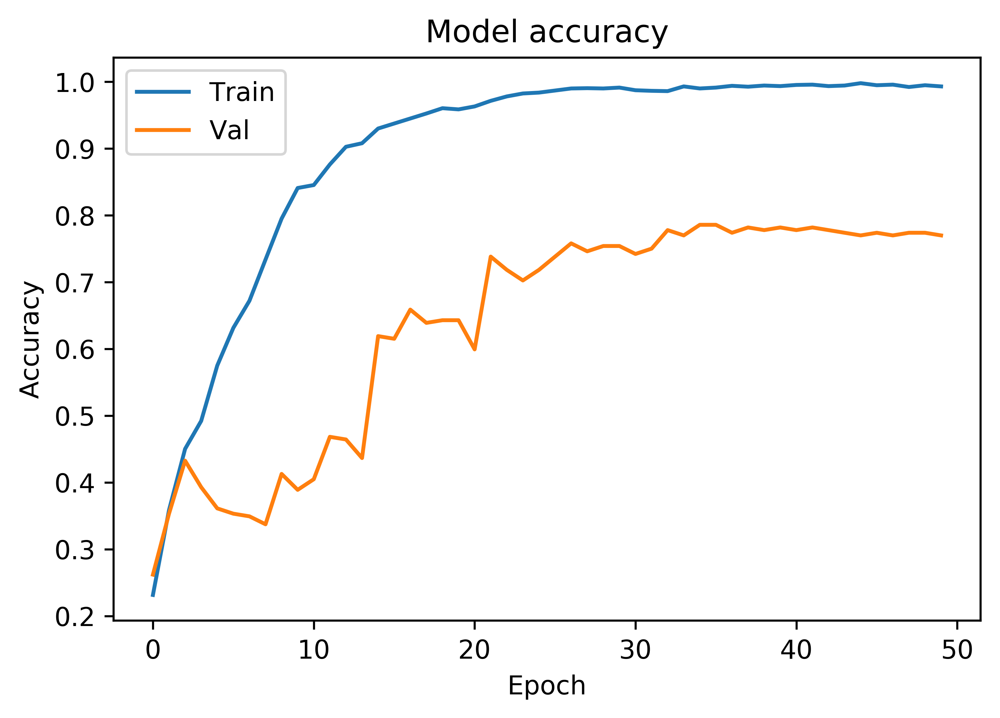

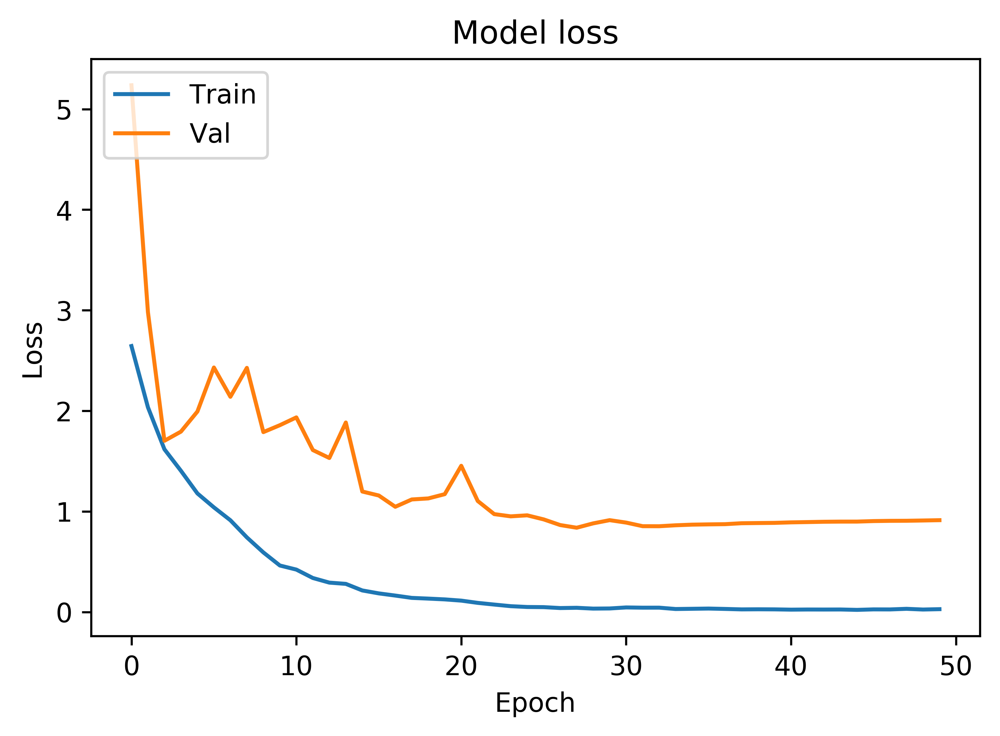

In [57]:
import matplotlib.pyplot as plt
# Plot training & validation accuracy values
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

### K fold validation on text only

In [58]:
#set K folds to 5
kfold = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=seed)
cvscores = []
count = 1
confusion_matrix_list = []
report_list = []

for train, test in kfold.split(np.zeros(len(y)), y.argmax(1)):
    print('K-fold: {}'.format(count))
    random.shuffle(train)
    text_model = Generate_Model(image = False, text=True)
    text_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    filepath="late_fusion_weights/best_weight_text_only_k-fold_{}.hdf5".format(count)
    checkpoint = MultiGPUCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
    callbacks_list = [reduce_lr, checkpoint, early_stopping]

    history = text_model.fit([X_text[train]], y[train], 
                     epochs=epochs, batch_size=128, validation_split=0.1, callbacks=callbacks_list)
    filepath="late_fusion_weights/final_weight_text_only_k-fold_{}.hdf5".format(count)
    text_model.save_weights(filepath)
    scores = text_model.evaluate([X_text[test]], y[test], verbose=0)
    print('Results from K-fold: {}'.format(count))
    print("%s: %.2f%%" % (image_model.metrics_names[1], scores[1]*100))
    cvscores.append(scores[1] * 100)
    y_hat = test_model(text_model, zip(X_text[test], y[test]), image = False, text = True, 
                       class_names=class_names)
    cm = confusion_matrix([np.argmax(t) for t in y[test]], y_hat)
    confusion_matrix_list.append(pd.DataFrame(cm, index=class_names, columns=class_names))
    report_list.append(classification_report([np.argmax(t) for t in y[test]], y_hat, target_names=class_names))
    count += 1
    print('================================================')
print('Average for kfold accuracy and stdev')
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

K-fold: 1
[INFO] training with 2 GPUs...
Train on 2260 samples, validate on 252 samples
Epoch 1/150
2260/2260 [==============================] - 14s 6ms/step - loss: 2.8967 - acc: 0.1898 - val_loss: 1.8585 - val_acc: 0.3532

Epoch 00001: val_acc improved from -inf to 0.35317, saving model to late_fusion_weights/best_weight_text_only_k-fold_1.hdf5
Epoch 2/150
2260/2260 [==============================] - 0s 178us/step - loss: 2.1726 - acc: 0.3115 - val_loss: 1.7485 - val_acc: 0.4603

Epoch 00002: val_acc improved from 0.35317 to 0.46032, saving model to late_fusion_weights/best_weight_text_only_k-fold_1.hdf5
Epoch 3/150
2260/2260 [==============================] - 0s 190us/step - loss: 1.7975 - acc: 0.4208 - val_loss: 1.2869 - val_acc: 0.5397

Epoch 00003: val_acc improved from 0.46032 to 0.53968, saving model to late_fusion_weights/best_weight_text_only_k-fold_1.hdf5
Epoch 4/150
2260/2260 [==============================] - 0s 173us/step - loss: 1.4505 - acc: 0.5265 - val_loss: 1.0345 - 

Results from K-fold: 1
acc: 77.06%
632/632 [==============================] - 0s 201us/step
[0.8961484228508382, 0.7705696210076537]
           bar  gel  network  plot  histology  sequence  line  molecular
bar         48    7        2     4         10         1     3          4
gel          4   63        0     0          9         1     1          1
network      3    0       60     0          3         0     2         11
plot        13    1        4    49          1         0     9          2
histology    1    0        4     0         69         0     0          5
sequence     2    3        0     0          0        66     0          8
line         4    2        1     7          1         0    60          4
molecular    0    0        2     0          5         0     0         72
              precision    recall  f1-score   support

         bar       0.64      0.61      0.62        79
         gel       0.83      0.80      0.81        79
     network       0.82      0.76      0.79    

2260/2260 [==============================] - 0s 167us/step - loss: 0.1835 - acc: 0.9385 - val_loss: 0.7930 - val_acc: 0.7937

Epoch 00025: val_acc did not improve from 0.80159
Epoch 26/150
2260/2260 [==============================] - 0s 166us/step - loss: 0.1782 - acc: 0.9425 - val_loss: 0.7983 - val_acc: 0.7857

Epoch 00026: ReduceLROnPlateau reducing learning rate to 4.0000001899898055e-05.

Epoch 00026: val_acc did not improve from 0.80159
Epoch 27/150
2260/2260 [==============================] - 0s 167us/step - loss: 0.1648 - acc: 0.9447 - val_loss: 0.8036 - val_acc: 0.7817

Epoch 00027: val_acc did not improve from 0.80159
Epoch 28/150
2260/2260 [==============================] - 0s 166us/step - loss: 0.1674 - acc: 0.9482 - val_loss: 0.8109 - val_acc: 0.7778

Epoch 00028: val_acc did not improve from 0.80159
Epoch 29/150
2260/2260 [==============================] - 0s 164us/step - loss: 0.1594 - acc: 0.9473 - val_loss: 0.8135 - val_acc: 0.7817

Epoch 00029: val_acc did not improve

[INFO] training with 2 GPUs...
Train on 2268 samples, validate on 252 samples
Epoch 1/150
2268/2268 [==============================] - 16s 7ms/step - loss: 2.9247 - acc: 0.2019 - val_loss: 1.8392 - val_acc: 0.3492

Epoch 00001: val_acc improved from -inf to 0.34921, saving model to late_fusion_weights/best_weight_text_only_k-fold_5.hdf5
Epoch 2/150
2268/2268 [==============================] - 0s 184us/step - loss: 2.1850 - acc: 0.3056 - val_loss: 1.6082 - val_acc: 0.4048

Epoch 00002: val_acc improved from 0.34921 to 0.40476, saving model to late_fusion_weights/best_weight_text_only_k-fold_5.hdf5
Epoch 3/150
2268/2268 [==============================] - 0s 196us/step - loss: 1.7643 - acc: 0.4180 - val_loss: 1.3282 - val_acc: 0.5397

Epoch 00003: val_acc improved from 0.40476 to 0.53968, saving model to late_fusion_weights/best_weight_text_only_k-fold_5.hdf5
Epoch 4/150
2268/2268 [==============================] - 0s 192us/step - loss: 1.4664 - acc: 0.5137 - val_loss: 1.2167 - val_acc: 0

### Plot training history

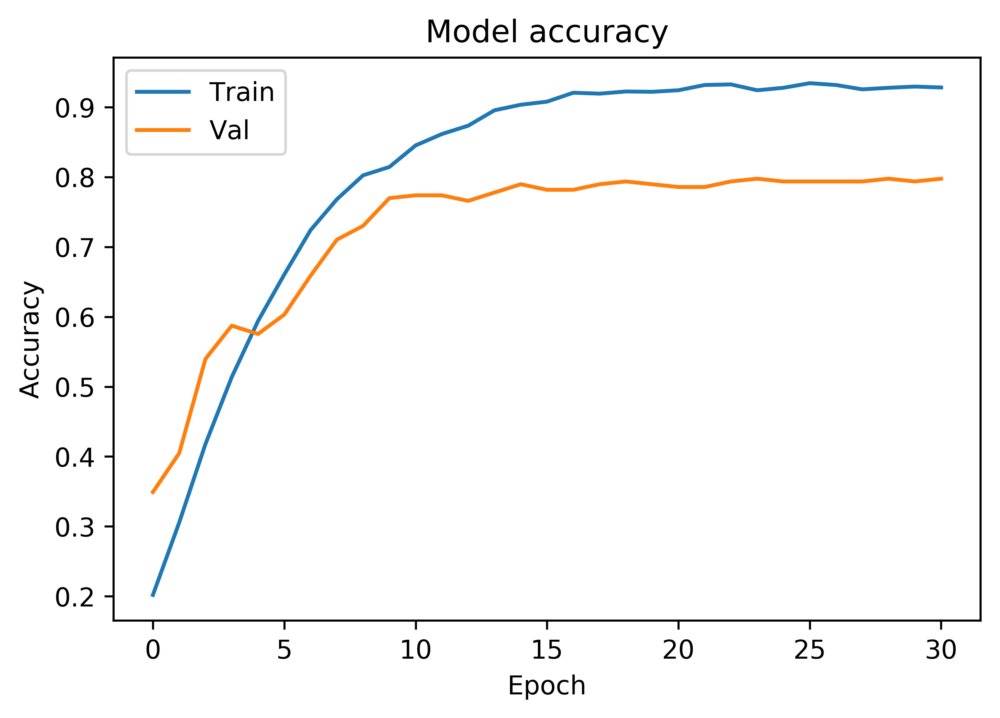

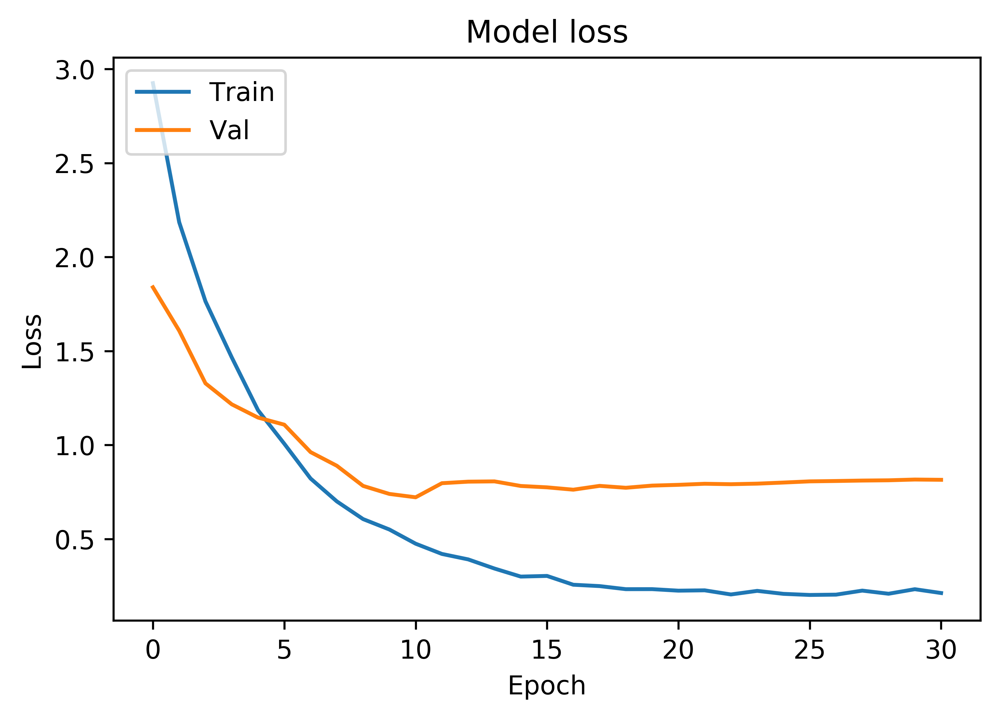

In [59]:
import matplotlib.pyplot as plt
# Plot training & validation accuracy values
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

### K-Fold validation Multimodal: Train text and images separately

In [60]:
'''Have to make the y_train onehot encoded otherwise it wont predict properly'''
'''When using validation_split = 0.10 it takes last 10% of data, so if 
your kfold does not shuffle it well enough it will give low validation 
accuracy, and in this case it wont even train class 16 well. Class 16
is the last class in the list. By coincidence, we have 314 images per 
class in our training set. When we pull the last 10 percent of the images
for validation, it is also 314 images, exactly missing one class. This
is why we get such a low validation score, it does not see one class and
cant really train that well because of it. It improves a little, but is crap.
Keras Documentation: validation_split: Float between 0 and 1. Fraction 
of the training data to be used as validation data. The model will set 
apart this fraction of the training data, will not train on it, and will 
evaluate the loss and any model metrics on this data at the end of each 
epoch. The validation data is selected from the last samples in the 
x and y data provided, before shuffling.
Performing random.shuffle(train) solves the problem
'''

#set K folds to 5
kfold = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=seed)
cvscores = []
count = 1
confusion_matrix_list = []
report_list = []

for train, test in kfold.split(np.zeros(len(y)), y.argmax(1)):
    print('K-fold: {}'.format(count))
    random.shuffle(train)
    filepath="late_fusion_weights/best_weight_image_text_separate_k-fold_{}.hdf5".format(count)
    checkpoint = MultiGPUCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
    callbacks_list = [reduce_lr, checkpoint, early_stopping]
    sub_callbacks_list = [reduce_lr, early_stopping]
    #Train images
    image_model = Generate_Model(image = True, text=False)
    image_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    image_history = image_model.fit([X_image[train]], y[train], 
                     epochs=epochs, batch_size=128, validation_split=0.1, callbacks=sub_callbacks_list)
    
    #Train text
    text_model = Generate_Model(image = False, text=True)
    text_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    text_history = text_model.fit([X_text[train]], y[train], 
                     epochs=epochs, batch_size=128, validation_split=0.1, callbacks=sub_callbacks_list)
    
    #Take the image model and text model and merge it
    outputs = [model.outputs[0] for model in [text_model, image_model]]
    output = Average()(outputs)    
    text_image_model = Model(inputs=[text_model.input, image_model.input], outputs=[output])
    text_image_model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
    filepath="late_fusion_weights/final_weight_image_text_separate_k-fold_{}.hdf5".format(count)
    text_image_model.save_weights(filepath)
    scores = text_image_model.evaluate([X_text[test], X_image[test]], y[test], verbose=0)
    print('Results from K-fold: {}'.format(count))
    print("%s: %.2f%%" % (text_image_model.metrics_names[1], scores[1]*100))
    cvscores.append(scores[1] * 100)
    y_hat = test_model(text_image_model, zip(X_text[test], X_image[test], y[test]), image = True, text = True, 
                       class_names=class_names)
    cm = confusion_matrix([np.argmax(t) for t in y[test]], y_hat)
    confusion_matrix_list.append(pd.DataFrame(cm, index=class_names, columns=class_names))
    report_list.append(classification_report([np.argmax(t) for t in y[test]], y_hat, target_names=class_names))
    count += 1
    print('================================================')
    
print('Average for kfold accuracy and stdev')
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

K-fold: 1
[INFO] training with 2 GPUs...
Train on 2260 samples, validate on 252 samples
Epoch 1/150
2260/2260 [==============================] - 19s 8ms/step - loss: 2.7112 - acc: 0.2381 - val_loss: 5.4355 - val_acc: 0.2738
Epoch 2/150
2260/2260 [==============================] - 3s 1ms/step - loss: 2.1361 - acc: 0.3487 - val_loss: 3.1099 - val_acc: 0.3611
Epoch 3/150
2260/2260 [==============================] - 3s 1ms/step - loss: 1.8094 - acc: 0.4226 - val_loss: 2.4103 - val_acc: 0.4048
Epoch 4/150
2260/2260 [==============================] - 3s 1ms/step - loss: 1.5735 - acc: 0.4903 - val_loss: 1.9602 - val_acc: 0.4167
Epoch 5/150
2260/2260 [==============================] - 3s 1ms/step - loss: 1.3058 - acc: 0.5513 - val_loss: 2.0312 - val_acc: 0.4722
Epoch 6/150
2260/2260 [==============================] - 3s 1ms/step - loss: 1.1037 - acc: 0.6088 - val_loss: 3.1732 - val_acc: 0.3373
Epoch 7/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.9285 - acc: 0.6792 - v

2260/2260 [==============================] - 2s 1ms/step - loss: 0.0784 - acc: 0.9761 - val_loss: 1.1097 - val_acc: 0.7024
Epoch 21/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.0800 - acc: 0.9761 - val_loss: 1.1188 - val_acc: 0.7143
Epoch 22/150
2260/2260 [==============================] - 2s 1ms/step - loss: 0.0631 - acc: 0.9814 - val_loss: 1.2398 - val_acc: 0.7183
Epoch 23/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.0740 - acc: 0.9788 - val_loss: 1.0260 - val_acc: 0.7579
Epoch 24/150
2260/2260 [==============================] - 2s 1ms/step - loss: 0.0492 - acc: 0.9872 - val_loss: 1.1273 - val_acc: 0.7143
Epoch 25/150
2260/2260 [==============================] - 2s 1ms/step - loss: 0.0474 - acc: 0.9858 - val_loss: 0.9043 - val_acc: 0.7619
Epoch 26/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.0482 - acc: 0.9841 - val_loss: 1.1334 - val_acc: 0.7302
Epoch 27/150
2260/2260 [==============================] - 3s 

Epoch 18/150
2260/2260 [==============================] - 0s 175us/step - loss: 0.2387 - acc: 0.9208 - val_loss: 0.8796 - val_acc: 0.7579
Epoch 19/150
2260/2260 [==============================] - 0s 174us/step - loss: 0.2274 - acc: 0.9292 - val_loss: 0.8456 - val_acc: 0.7659
Epoch 20/150
2260/2260 [==============================] - 0s 206us/step - loss: 0.2226 - acc: 0.9239 - val_loss: 0.8521 - val_acc: 0.7659
Epoch 21/150
2260/2260 [==============================] - 0s 190us/step - loss: 0.2234 - acc: 0.9243 - val_loss: 0.8512 - val_acc: 0.7738

Epoch 00021: ReduceLROnPlateau reducing learning rate to 4.0000001899898055e-05.
Epoch 22/150
2260/2260 [==============================] - 0s 171us/step - loss: 0.2140 - acc: 0.9265 - val_loss: 0.8504 - val_acc: 0.7738
Epoch 23/150
2260/2260 [==============================] - 0s 166us/step - loss: 0.2254 - acc: 0.9257 - val_loss: 0.8425 - val_acc: 0.7738
Epoch 24/150
2260/2260 [==============================] - 0s 170us/step - loss: 0.1887 - a

[INFO] training with 2 GPUs...
Train on 2268 samples, validate on 252 samples
Epoch 1/150
2268/2268 [==============================] - 23s 10ms/step - loss: 2.6543 - acc: 0.2403 - val_loss: 3.5500 - val_acc: 0.2857
Epoch 2/150
2268/2268 [==============================] - 3s 1ms/step - loss: 2.0969 - acc: 0.3417 - val_loss: 2.5269 - val_acc: 0.3095
Epoch 3/150
2268/2268 [==============================] - 3s 1ms/step - loss: 1.8046 - acc: 0.3981 - val_loss: 2.0568 - val_acc: 0.4087
Epoch 4/150
2268/2268 [==============================] - 3s 1ms/step - loss: 1.5587 - acc: 0.4753 - val_loss: 1.9928 - val_acc: 0.4048
Epoch 5/150
2268/2268 [==============================] - 3s 1ms/step - loss: 1.3119 - acc: 0.5309 - val_loss: 1.4856 - val_acc: 0.4802
Epoch 6/150
2268/2268 [==============================] - 3s 1ms/step - loss: 1.1453 - acc: 0.5974 - val_loss: 2.0380 - val_acc: 0.3889
Epoch 7/150
2268/2268 [==============================] - 3s 1ms/step - loss: 1.0210 - acc: 0.6512 - val_loss: 

2268/2268 [==============================] - 2s 1ms/step - loss: 0.0579 - acc: 0.9806 - val_loss: 0.8579 - val_acc: 0.7698
Epoch 29/150
2268/2268 [==============================] - 2s 1ms/step - loss: 0.0502 - acc: 0.9903 - val_loss: 0.8030 - val_acc: 0.7857
Epoch 30/150
2268/2268 [==============================] - 3s 1ms/step - loss: 0.0568 - acc: 0.9846 - val_loss: 0.8095 - val_acc: 0.8016
Epoch 31/150
2268/2268 [==============================] - 2s 1ms/step - loss: 0.0534 - acc: 0.9850 - val_loss: 0.7891 - val_acc: 0.7897
Epoch 32/150
2268/2268 [==============================] - 2s 1ms/step - loss: 0.0440 - acc: 0.9894 - val_loss: 0.8099 - val_acc: 0.7937
Epoch 33/150
2268/2268 [==============================] - 2s 1ms/step - loss: 0.0475 - acc: 0.9868 - val_loss: 0.8242 - val_acc: 0.7937
Epoch 34/150
2268/2268 [==============================] - 2s 1ms/step - loss: 0.0422 - acc: 0.9872 - val_loss: 0.8648 - val_acc: 0.7937
Epoch 35/150
2268/2268 [==============================] - 2s 

### Plot training history

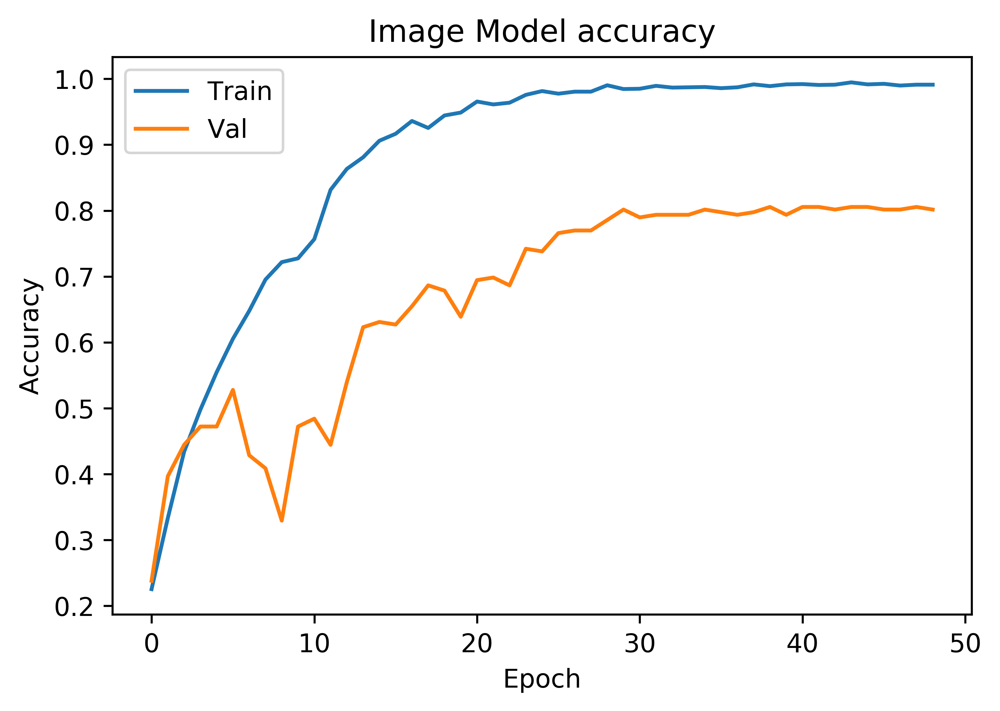

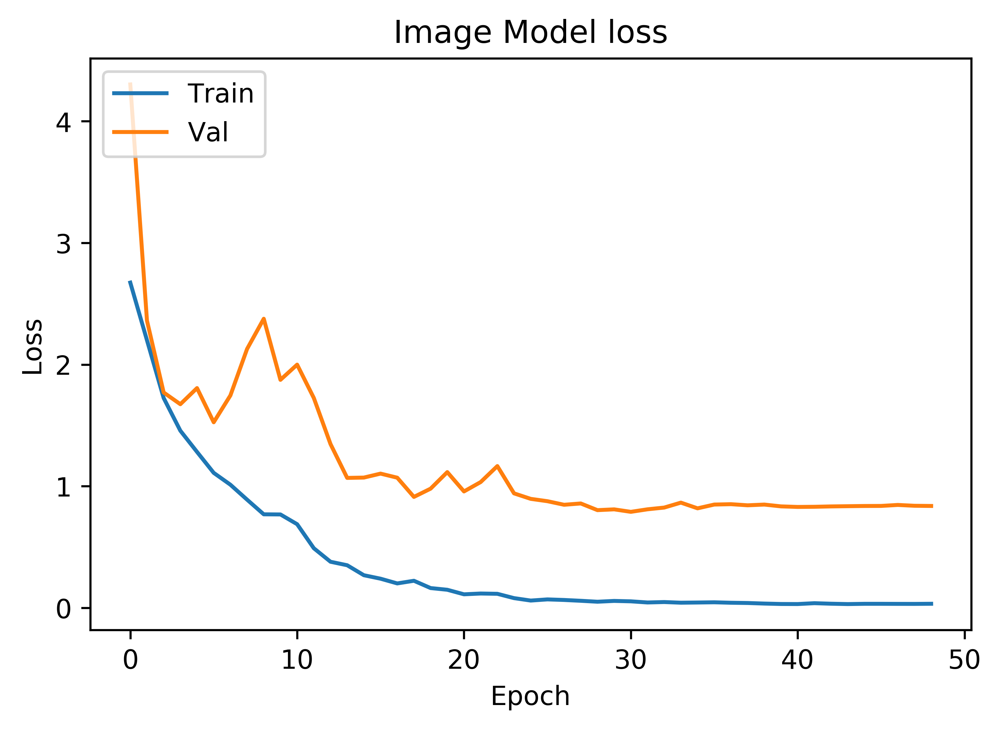

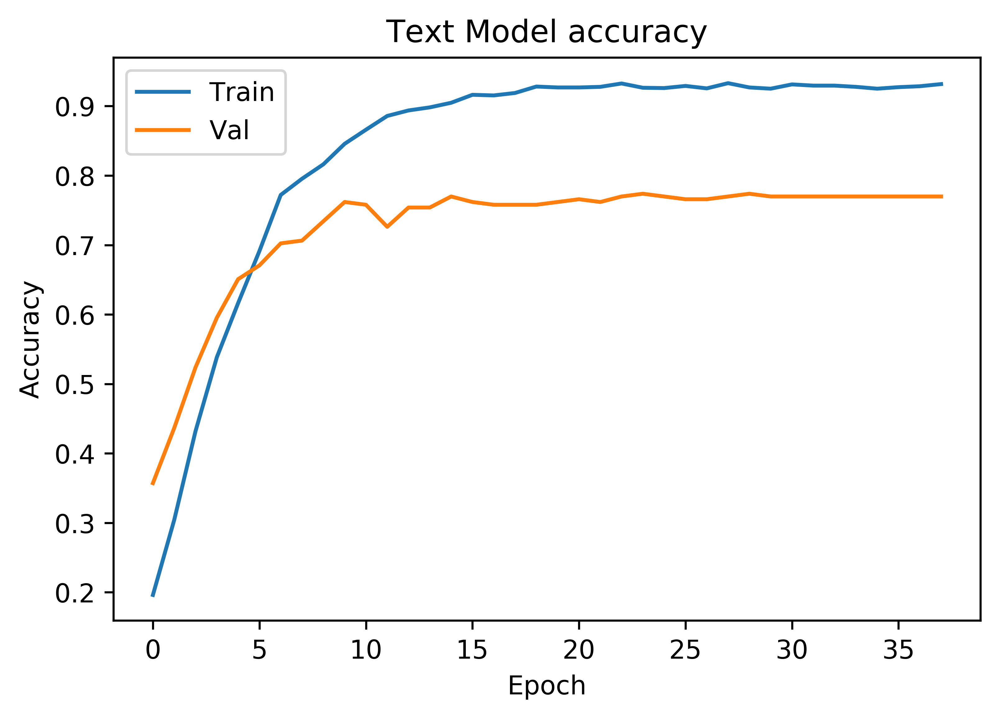

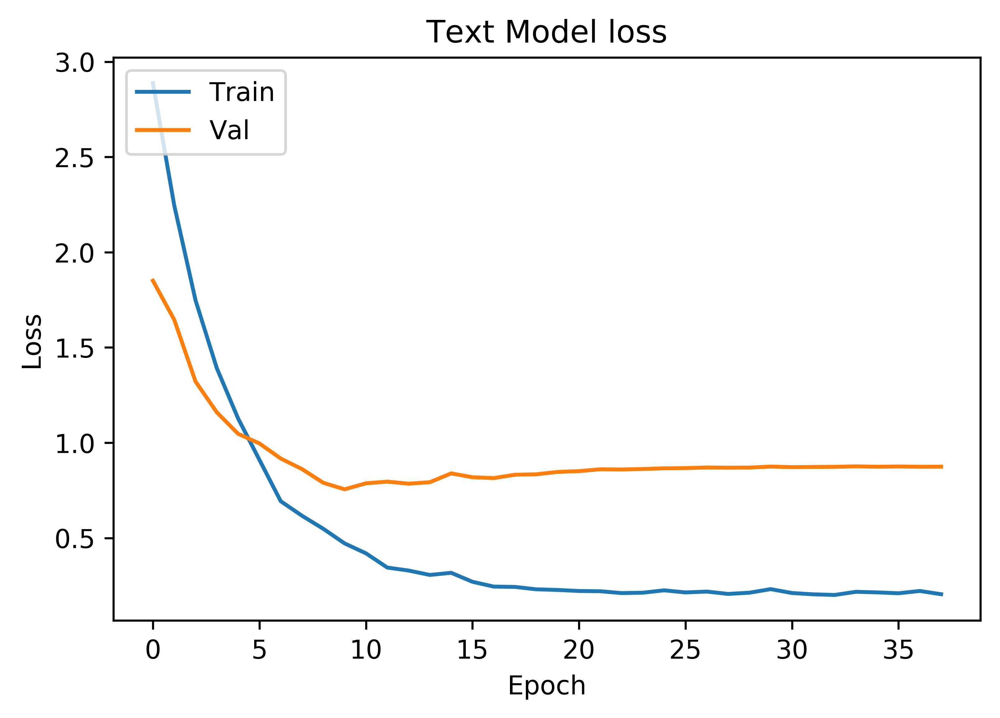

In [61]:
import matplotlib.pyplot as plt
image_history
text_history
# Plot image training & validation accuracy values
plt.plot(image_history.history['acc'])
plt.plot(image_history.history['val_acc'])
plt.title('Image Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

# Plot image training & validation loss values
plt.plot(image_history.history['loss'])
plt.plot(image_history.history['val_loss'])
plt.title('Image Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

# Plot text training & validation accuracy values
plt.plot(text_history.history['acc'])
plt.plot(text_history.history['val_acc'])
plt.title('Text Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

# Plot text training & validation loss values
plt.plot(text_history.history['loss'])
plt.plot(text_history.history['val_loss'])
plt.title('Text Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

blue = ground truth, red = prediction


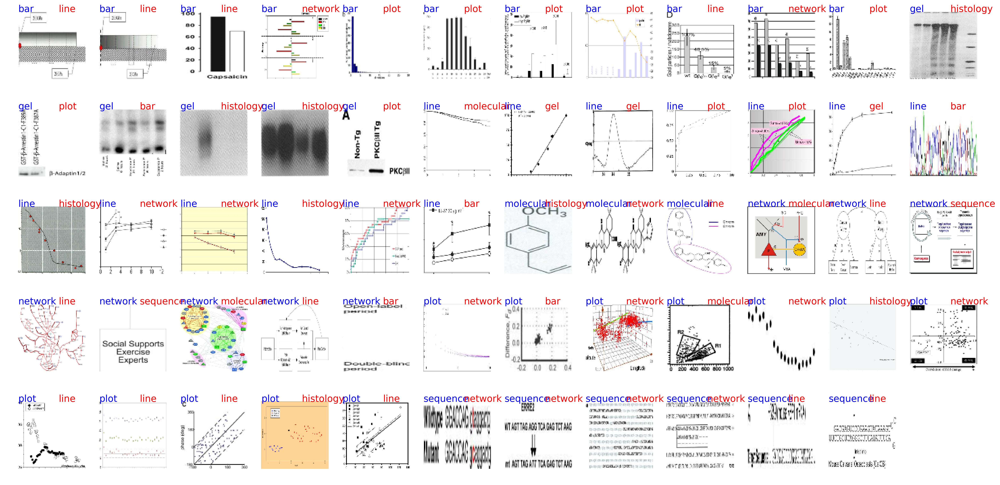

In [62]:
#convert to categorical from one-hot
y_hat_fig = y_hat#[ np.argmax(t) for t in y_hat ] #y_hat is already in the encoded format
y_test_fig = [ np.argmax(t) for t in y[test] ]
test_wrong = [im for im in zip(X_image[test], y_hat_fig,y_test_fig) if im[1] != im[2]]#Need this for images
import matplotlib.pyplot as plt
print('blue = ground truth, red = prediction')
plt.figure(figsize=(20, 20), dpi=300)
for ind, val in enumerate(test_wrong[:100]):
    plt.subplots_adjust(left=0, right=1, bottom=0, top=1)
    plt.subplot(10, 12, ind + 1)
    im = val[0]
    plt.axis("off")
    plt.text(0, 0, NN_Class_Names[val[2]], fontsize=14, color='blue')
    plt.text(60, 0, NN_Class_Names[val[1]], fontsize=14, color='red')
    plt.imshow(im, cmap='gray')

### K-Fold validation Multimodal: text and images together

In [63]:
'''Have to make the y_train onehot encoded otherwise it wont predict properly'''
'''When using validation_split = 0.10 it takes last 10% of data, so if 
your kfold does not shuffle it well enough it will give low validation 
accuracy, and in this case it wont even train class 16 well. Class 16
is the last class in the list. By coincidence, we have 314 images per 
class in our training set. When we pull the last 10 percent of the images
for validation, it is also 314 images, exactly missing one class. This
is why we get such a low validation score, it does not see one class and
cant really train that well because of it. It improves a little, but is crap.
Keras Documentation: validation_split: Float between 0 and 1. Fraction 
of the training data to be used as validation data. The model will set 
apart this fraction of the training data, will not train on it, and will 
evaluate the loss and any model metrics on this data at the end of each 
epoch. The validation data is selected from the last samples in the 
x and y data provided, before shuffling.
Performing random.shuffle(train) solves the problem
'''

#set K folds to 5
kfold = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=seed)
cvscores = []
count = 1
confusion_matrix_list = []
report_list = []

for train, test in kfold.split(np.zeros(len(y)), y.argmax(1)):
    print('K-fold: {}'.format(count))
    random.shuffle(train)
    text_image_model = Generate_Model(image = True, text=True)
    text_image_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    filepath="late_fusion_weights/best_weight_image_text_k-fold_{}.hdf5".format(count)
    checkpoint = MultiGPUCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
    callbacks_list = [reduce_lr, checkpoint, early_stopping]

    history = text_image_model.fit([X_text[train], X_image[train]], y[train], 
                     epochs=epochs, batch_size=128, validation_split=0.1, callbacks=callbacks_list)
    filepath="late_fusion_weights/final_weight_image_text_k-fold_{}.hdf5".format(count)
    text_image_model.save_weights(filepath)
    scores = text_image_model.evaluate([X_text[test], X_image[test]], y[test], verbose=0)
    print('Results from K-fold: {}'.format(count))
    print("%s: %.2f%%" % (text_image_model.metrics_names[1], scores[1]*100))
    cvscores.append(scores[1] * 100)
    y_hat = test_model(text_image_model, zip(X_text[test], X_image[test], y[test]), image = True, text = True, 
                       class_names=class_names)
    cm = confusion_matrix([np.argmax(t) for t in y[test]], y_hat)
    confusion_matrix_list.append(pd.DataFrame(cm, index=class_names, columns=class_names))
    report_list.append(classification_report([np.argmax(t) for t in y[test]], y_hat, target_names=class_names))
    count += 1
    print('================================================')
    
print('Average for kfold accuracy and stdev')
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

K-fold: 1
[INFO] training with 2 GPUs...
Train on 2260 samples, validate on 252 samples
Epoch 1/150
2260/2260 [==============================] - 30s 13ms/step - loss: 2.2345 - acc: 0.2323 - val_loss: 2.3189 - val_acc: 0.2619

Epoch 00001: val_acc improved from -inf to 0.26190, saving model to late_fusion_weights/best_weight_image_text_k-fold_1.hdf5
Epoch 2/150
2260/2260 [==============================] - 3s 1ms/step - loss: 1.7029 - acc: 0.3965 - val_loss: 1.6978 - val_acc: 0.3770

Epoch 00002: val_acc improved from 0.26190 to 0.37698, saving model to late_fusion_weights/best_weight_image_text_k-fold_1.hdf5
Epoch 3/150
2260/2260 [==============================] - 3s 1ms/step - loss: 1.3975 - acc: 0.5310 - val_loss: 1.4600 - val_acc: 0.5238

Epoch 00003: val_acc improved from 0.37698 to 0.52381, saving model to late_fusion_weights/best_weight_image_text_k-fold_1.hdf5
Epoch 4/150
2260/2260 [==============================] - 3s 1ms/step - loss: 1.1020 - acc: 0.6412 - val_loss: 1.3209 - va

2260/2260 [==============================] - 3s 1ms/step - loss: 0.2585 - acc: 0.9372 - val_loss: 0.8222 - val_acc: 0.7698

Epoch 00018: val_acc did not improve from 0.80952
Epoch 19/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.2188 - acc: 0.9562 - val_loss: 0.8448 - val_acc: 0.7659

Epoch 00019: val_acc did not improve from 0.80952
Epoch 20/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.2066 - acc: 0.9611 - val_loss: 0.7019 - val_acc: 0.8333

Epoch 00020: val_acc improved from 0.80952 to 0.83333, saving model to late_fusion_weights/best_weight_image_text_k-fold_2.hdf5
Epoch 21/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.2083 - acc: 0.9659 - val_loss: 0.9931 - val_acc: 0.7579

Epoch 00021: val_acc did not improve from 0.83333
Epoch 22/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.2069 - acc: 0.9584 - val_loss: 0.8533 - val_acc: 0.7817

Epoch 00022: ReduceLROnPlateau reducing learning r

2260/2260 [==============================] - 34s 15ms/step - loss: 2.2145 - acc: 0.2509 - val_loss: 2.2568 - val_acc: 0.3175

Epoch 00001: val_acc improved from -inf to 0.31746, saving model to late_fusion_weights/best_weight_image_text_k-fold_3.hdf5
Epoch 2/150
2260/2260 [==============================] - 3s 1ms/step - loss: 1.6880 - acc: 0.4195 - val_loss: 1.5684 - val_acc: 0.4841

Epoch 00002: val_acc improved from 0.31746 to 0.48413, saving model to late_fusion_weights/best_weight_image_text_k-fold_3.hdf5
Epoch 3/150
2260/2260 [==============================] - 3s 1ms/step - loss: 1.4452 - acc: 0.5088 - val_loss: 1.3564 - val_acc: 0.5397

Epoch 00003: val_acc improved from 0.48413 to 0.53968, saving model to late_fusion_weights/best_weight_image_text_k-fold_3.hdf5
Epoch 4/150
2260/2260 [==============================] - 3s 1ms/step - loss: 1.2416 - acc: 0.5827 - val_loss: 1.3149 - val_acc: 0.5397

Epoch 00004: val_acc did not improve from 0.53968
Epoch 5/150
2260/2260 [============

2260/2260 [==============================] - 3s 1ms/step - loss: 0.0892 - acc: 0.9841 - val_loss: 0.4471 - val_acc: 0.8690

Epoch 00039: val_acc did not improve from 0.87698
Epoch 40/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.0914 - acc: 0.9827 - val_loss: 0.4352 - val_acc: 0.8690

Epoch 00040: val_acc did not improve from 0.87698
Epoch 41/150
2260/2260 [==============================] - 3s 1ms/step - loss: 0.0902 - acc: 0.9827 - val_loss: 0.4237 - val_acc: 0.8770

Epoch 00041: val_acc improved from 0.87698 to 0.87698, saving model to late_fusion_weights/best_weight_image_text_k-fold_3.hdf5
Results from K-fold: 3
acc: 88.13%
632/632 [==============================] - 1s 982us/step
[0.5135660213005694, 0.8813291131695614]
           bar  gel  network  plot  histology  sequence  line  molecular
bar         66    1        3     2          5         0     2          0
gel          1   69        1     0          5         1     2          0
network      1    0   

[INFO] training with 2 GPUs...
Train on 2268 samples, validate on 252 samples
Epoch 1/150
2268/2268 [==============================] - 37s 16ms/step - loss: 2.1964 - acc: 0.2584 - val_loss: 2.0174 - val_acc: 0.3651

Epoch 00001: val_acc improved from -inf to 0.36508, saving model to late_fusion_weights/best_weight_image_text_k-fold_5.hdf5
Epoch 2/150
2268/2268 [==============================] - 3s 1ms/step - loss: 1.6372 - acc: 0.4361 - val_loss: 1.4647 - val_acc: 0.5159

Epoch 00002: val_acc improved from 0.36508 to 0.51587, saving model to late_fusion_weights/best_weight_image_text_k-fold_5.hdf5
Epoch 3/150
2268/2268 [==============================] - 3s 1ms/step - loss: 1.3271 - acc: 0.5719 - val_loss: 1.3031 - val_acc: 0.5278

Epoch 00003: val_acc improved from 0.51587 to 0.52778, saving model to late_fusion_weights/best_weight_image_text_k-fold_5.hdf5
Epoch 4/150
2268/2268 [==============================] - 3s 1ms/step - loss: 1.0972 - acc: 0.6468 - val_loss: 0.9979 - val_acc: 0.6

### Plot training history

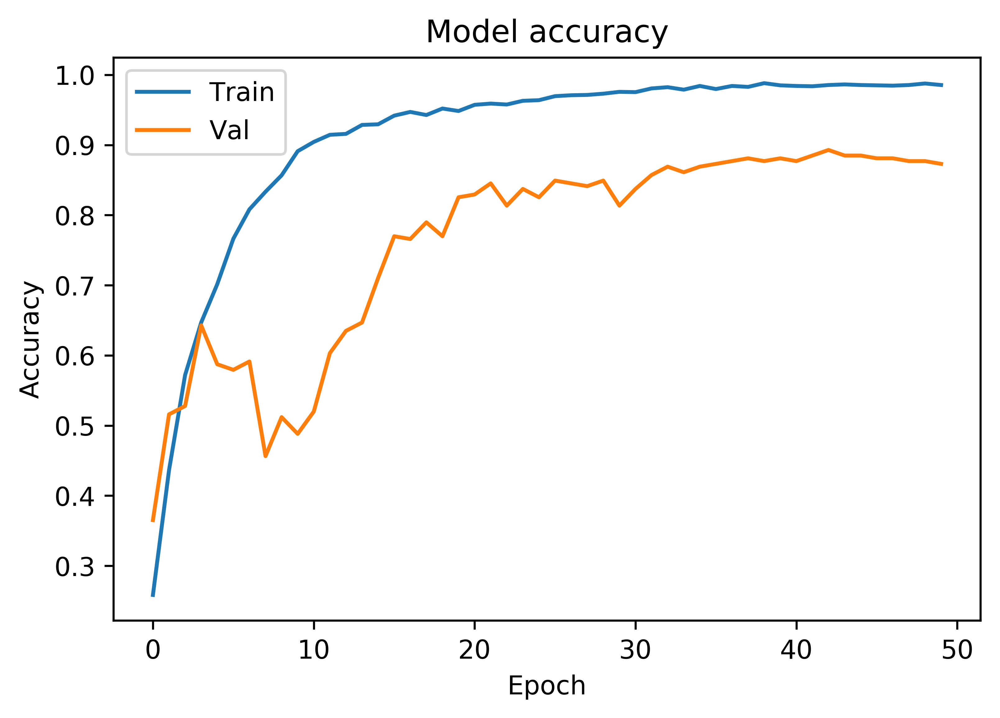

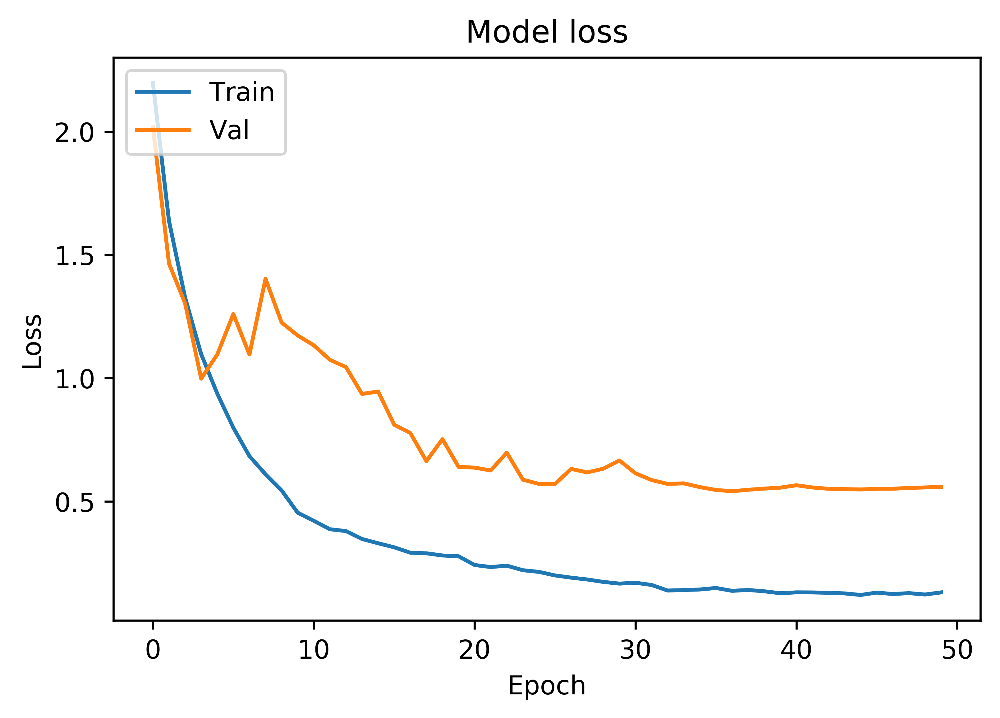

In [64]:
import matplotlib.pyplot as plt
# Plot training & validation accuracy values
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

### View images

blue = ground truth, red = prediction


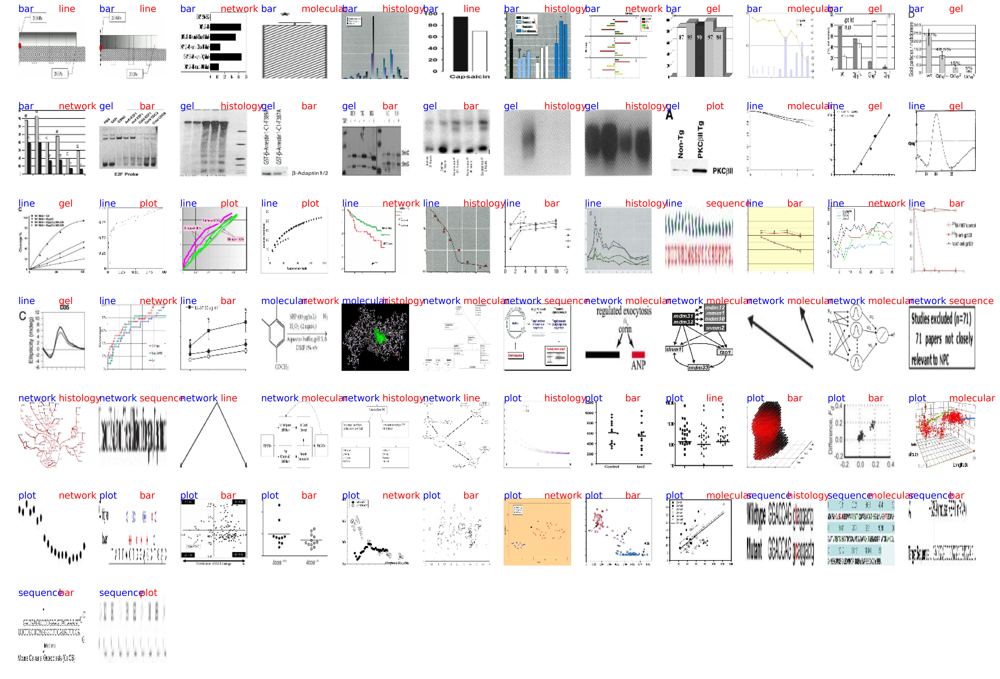

In [65]:
#convert to categorical from one-hot
y_hat_fig = y_hat#[ np.argmax(t) for t in y_hat ] #y_hat is already in the encoded format
y_test_fig = [ np.argmax(t) for t in y[test] ]
test_wrong = [im for im in zip(X_image[test], y_hat_fig,y_test_fig) if im[1] != im[2]]#Need this for images
import matplotlib.pyplot as plt
print('blue = ground truth, red = prediction')
plt.figure(figsize=(20, 20), dpi=300)
for ind, val in enumerate(test_wrong[:100]):
    plt.subplots_adjust(left=0, right=1, bottom=0, top=1)
    plt.subplot(10, 12, ind + 1)
    im = val[0]
    plt.axis("off")
    plt.text(0, 0, NN_Class_Names[val[2]], fontsize=14, color='blue')
    plt.text(60, 0, NN_Class_Names[val[1]], fontsize=14, color='red')
    plt.imshow(im, cmap='gray')